__Author:__ Bram Van de Sande

__Date:__ 14 JUN 2019

__Outline:__ Acquistion and cleaning of selected scRNAseq data sets.

_Experiments:_

| Accession ID | Cancer type | 
| ------------- | ----------- | 
| GSE60361 | Mouse brain |
| GSE115978     | SKCM        | 
| GSE103322     | HNSC | 
| E-MTAB-6149/E-MTAB-6653 | LUSC, LUAD |

In [2]:
import os, glob, re, pickle
from functools import partial
from collections import OrderedDict

import GEOparse

import pandas as pd
import seaborn as sns
import numpy as np
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt

from pyscenic.export import export2loom

/home/bramvds/Documents/miniconda3/lib/python3.6/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


In [3]:
# Set maximum number of jobs
sc.settings.njobs = 32

__GSE60361__

In [143]:
BASE_FOLDERNAME = '/Users/bramvandesande/Projects/lcb/scenic_protocol/datasets/zeisel'

# Downloaded expression matrix from GEO on 13 JUN 2019 (https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE60361).
COUNTS_MTX_FNAME = os.path.join(BASE_FOLDERNAME, 'GSE60361_C1-3005-Expression.txt')
# Downloaded metadata from http://linnarssonlab.org/cortex/ on 13 JUN 2019
METADATA_FNAME = os.path.join(BASE_FOLDERNAME, 'expression_mRNA_17-Aug-2014.txt')

# Output file
COUNTS_QC_MTX_FNAME = os.path.join(BASE_FOLDERNAME, 'GSE60361.qc.counts.csv')
MM_TFS_FNAME = os.path.join(BASE_FOLDERNAME, 'mm_tfs.txt')

In [135]:
#Create list of M. musculus transcription factors.

pd_motifs = pd.read_csv('/Users/bramvandesande/Projects/lcb/resources/motifs-v9-nr.mgi-m0.001-o0.0.tbl', sep='\t')

/Users/bramvandesande/.local/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3049: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [139]:
mm_tfs = pd_motifs.gene_name.unique()
len(mm_tfs)

1721

In [144]:
with open(MM_TFS_FNAME, 'wt') as f:
    f.write('\n'.join(mm_tfs) + '\n')

In [29]:
df_counts = pd.read_csv(EXPRESSION_MTX_FNAME, sep='\t', index_col=0)
df_counts.shape

(19972, 3005)

In [81]:
df_metadata = pd.read_csv(METADATA_FNAME, sep='\t', index_col=1, nrows=9).drop(columns=['Unnamed: 0']).T.reset_index() #.drop(columns=['index', 'group #'])
df_metadata.columns.name = ''

In [96]:
df_metadata.age = df_metadata.age.astype(int)

In [97]:
df_metadata.head()

,index,group #,total mRNA mol,well,sex,age,diameter,cell_id,level1class,level2class
0,sscortex,1,21580,11,1,21,0,1772071015_C02,interneurons,Int10
1,sscortex.1,1,21748,95,-1,20,9.56,1772071017_G12,interneurons,Int10
2,sscortex.2,1,31642,33,-1,20,11.1,1772071017_A05,interneurons,Int6
3,sscortex.3,1,32916,42,1,21,11.7,1772071014_B06,interneurons,Int10
4,sscortex.4,1,21531,48,1,25,11,1772067065_H06,interneurons,Int9


In [131]:
adata = sc.AnnData(X=df_counts.T.sort_index())
adata.obs = df_metadata.set_index('cell_id').sort_index()
adata.var_names_make_unique
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
adata.raw = adata #Store non-log transformed data as raw. This data can be used via the use_raw parameters available for many functions.
df_counts_qc = adata.to_df()
sc.pp.normalize_total(adata, fraction=0.9)
sc.pp.log1p(adata)
adata

AnnData object with n_obs × n_vars = 3005 × 18879 
    obs: 'index', 'group #', 'total mRNA mol', 'well', 'sex', 'age', 'diameter', 'level1class', 'level2class', 'n_genes'
    var: 'n_cells'

In [132]:
df_counts_qc.to_csv(COUNTS_QC_MTX_FNAME)

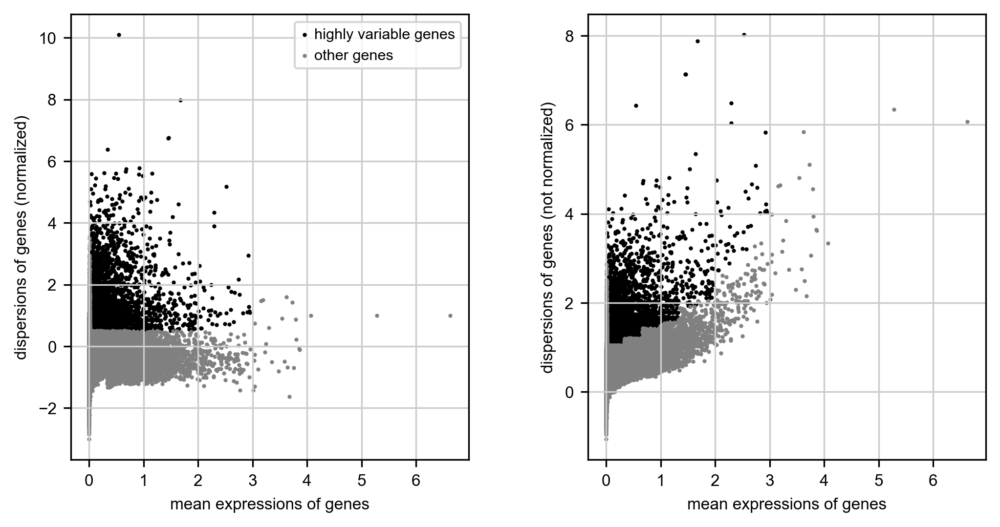

In [114]:
sc.pp.highly_variable_genes(adata)
sc.pl.highly_variable_genes(adata)

In [115]:
adata = adata[:, adata.var['highly_variable']]

In [116]:
sc.tl.pca(adata, svd_solver='arpack')

Trying to set attribute `.obsm` of view, making a copy.


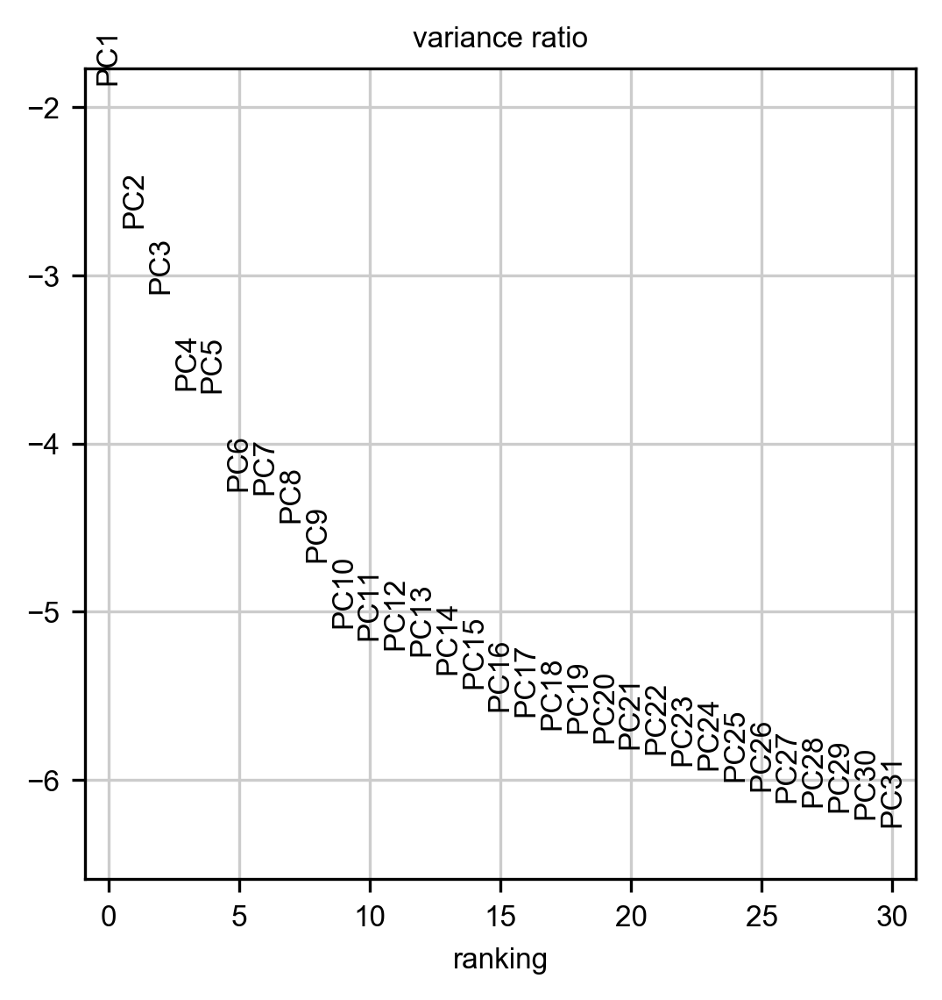

In [117]:
sc.pl.pca_variance_ratio(adata, log=True)

In [118]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.tsne(adata)
sc.tl.louvain(adata)

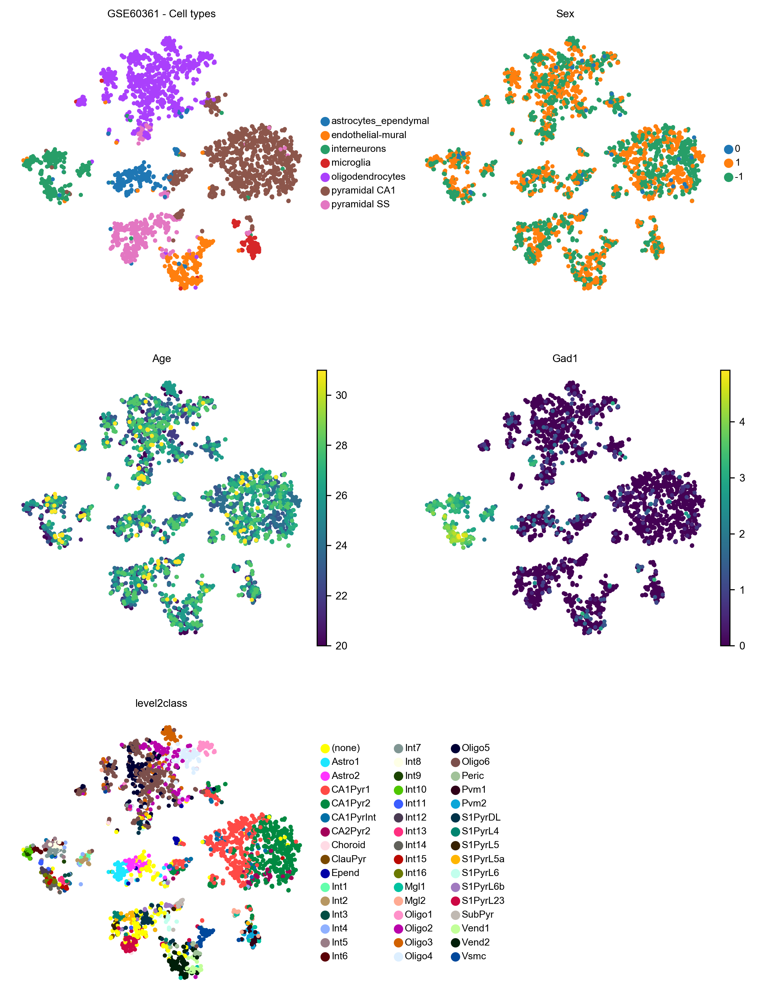

In [129]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=8)
sc.pl.tsne(adata, color=['level1class', 'sex', 'age', 'Gad1', 'level2class' ], 
           title=['GSE60361 - Cell types', 'Sex', 'Age', 'Gad1', 'level2class'], ncols=2, use_raw=False)

In [120]:
len(df_metadata.well.unique())

96

# GSE115978 - Cutaneous Melanoma (SKCM)

_Publication:_

A Cancer Cell Program Promotes T Cell Exclusion and Resistance to Checkpoint Blockade.

Livnat Jerby-Arnon, Parin Shah, Michael S Cuoco, Christopher Rodman, Mei-Ju Su, Johannes C Melms, Rachel Leeson, Abhay Kanodia, Shaolin Mei, Jia-Ren Lin, Shu Wang, Bokang Rabasha, David Liu, Gao Zhang, Claire Margolais, Orr Ashenberg, Patrick A Ott, Elizabeth I Buchbinder, Rizwan Haq, F Stephen Hodi, Genevieve M Boland, Ryan J Sullivan, Dennie T Frederick, Benchun Miao, Tabea Moll, Keith T Flaherty, Meenhard Herlyn, Russell W Jenkins, Rohit Thummalapalli, Monika S Kowalczyk, Israel Cañadas, Bastian Schilling, Adam N R Cartwright, Adrienne M Luoma, Shruti Malu, Patrick Hwu, Chantale Bernatchez, Marie-Andrée Forget, David A Barbie, Alex K Shalek, Itay Tirosh, Peter K Sorger, Kai Wucherpfennig, Eliezer M Van Allen, Dirk Schadendorf, Bruce E Johnson, Asaf Rotem, Orit Rozenblatt-Rosen, Levi A Garraway, Charles H Yoon, Benjamin Izar, Aviv Regev

Immune checkpoint inhibitors (ICIs) produce durable responses in some melanoma patients, but many patients derive no clinical benefit, and the molecular underpinnings of such resistance remain elusive. Here, we leveraged single-cell RNA sequencing (scRNA-seq) from 33 melanoma tumors and computational analyses to interrogate malignant cell states that promote immune evasion. We identified a resistance program expressed by malignant cells that is associated with T cell exclusion and immune evasion. The program is expressed prior to immunotherapy, characterizes cold niches in situ, and predicts clinical responses to anti-PD-1 therapy in an independent cohort of 112 melanoma patients. CDK4/6-inhibition represses this program in individual malignant cells, induces senescence, and reduces melanoma tumor outgrowth in mouse models in vivo when given in combination with immunotherapy. Our study provides a high-resolution landscape of ICI-resistant cell states, identifies clinically predictive signatures, and suggests new therapeutic strategies to overcome immunotherapy resistance.

Cell 2018

https://dx.doi.org/10.1016/j.cell.2018.09.006


_Data set acquisition:_

https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE115978

_Remarks:_
1. This data set includes samples from previous study (Itay Tirosh et al.).
2. One sample, i.e. Mel75, was analyzed in this previous study as well as in this subsequent study.
3. Codes:

| Code | Description |
| ---- | ----------- |
| OR | Objective Response |
| ICI | Immune Checkpoint Inhibitor |

In [1]:
BASE_FOLDER = "/home/bramvds/Documents/datasets/GSE115978"
# Downloaded from GEO on 28 FEB 2019.
CELL_ANNOTATIONS_FNAME = os.path.join(BASE_FOLDER, "GSE115978_cell.annotations.csv")
# Downloaded from Cell Journal website on 1 MAR 2019.
SAMPLE_METADATA_FNAME = os.path.join(BASE_FOLDER, "1-s2.0-S0092867418311784-mmc1.xlsx")

EXP_MTX_TPM_FNAME = os.path.join(BASE_FOLDER, 'GSE115978.tpm.csv')
EXP_MTX_COUNTS_FNAME = os.path.join(BASE_FOLDER, 'GSE115978.counts.csv')
METADATA_FNAME = os.path.join(BASE_FOLDER, 'GSE115978.metadata.csv')
SCORES_MTX_FNAME = os.path.join(BASE_FOLDER, 'GSE115978.scores.csv')
ANNDATA_FNAME = os.path.join(BASE_FOLDER, 'GSE115978.h5ad')

EXP_MTX_QC_TPM_FNAME = os.path.join(BASE_FOLDER, 'GSE115978.qc.tpm.csv')
AUCELL_MTX_FNAME = '/home/bramvds/Documents/scenic_resources/GSE115978.auc.csv'
REGULONS_DAT_FNAME = '/home/bramvds/Documents/scenic_resources/GSE115978.regulons.dat'
LOOM_FNAME = '/home/bramvds/Documents/scenic_resources/GSE115978.loom'

NameError: name 'os' is not defined

__METADATA CLEANING__

In [4]:
df_annotations = pd.read_csv(CELL_ANNOTATIONS_FNAME)
df_annotations['samples'] = df_annotations['samples'].str.upper()
df_annotations.rename(columns={'cell.types': 'cell_type', 'cells': 'cell_id', 'samples': 'sample_id', 
                               'treatment.group': 'treatment_group', 'Cohort': 'cohort'}, inplace=True)
df_annotations['cell_type'] = df_annotations.cell_type.replace({
    'Mal': 'Malignant Cell',
    'Endo.': 'Endothelial Cell',
    'T.CD4': 'Thelper Cell',
    'CAF': 'Fibroblast',
    'T.CD8': 'Tcytotoxic Cell',
    'T.cell': 'T Cell',
    'NK': 'NK Cell',
    'B.cell': 'B Cell'})

In [5]:
df_samples = pd.read_excel(SAMPLE_METADATA_FNAME, header=2)
df_samples = df_samples.drop(['Cohort'], axis=1)
df_samples['Sample'] = df_samples.Sample.str.upper()

In [6]:
df_metadata = pd.merge(df_annotations, df_samples, left_on='sample_id', right_on='Sample')
df_metadata = df_metadata.drop(['Sample', 'treatment_group'], axis=1)
df_metadata.rename(columns={'Patient': 'patient_id',
                           'Age': 'age', 'Sex': 'sex', 'Lesion type': 'lesion_type', 'Site': 'site',
                           'Treatment': 'treatment', 'Treatment group': 'treatment_group'}, inplace=True)

In [7]:
df_metadata.head()

,cell_id,sample_id,cell_type,cohort,no.of.genes,no.of.reads,patient_id,age,sex,treatment,treatment_group,lesion_type,site
0,cy78_CD45_neg_1_B04_S496_comb,MEL78,Malignant Cell,Tirosh,8258,357919,Mel78,73,M,"WDVAX, ipilimumab + nivolumab",Post-ICI (resistant),metastasis,Small bowel
1,cy78_CD45_neg_3_H06_S762_comb,MEL78,Malignant Cell,Tirosh,7409,380341,Mel78,73,M,"WDVAX, ipilimumab + nivolumab",Post-ICI (resistant),metastasis,Small bowel
2,cy78_CD45_neg_1_D07_S523_comb,MEL78,Malignant Cell,Tirosh,8548,394632,Mel78,73,M,"WDVAX, ipilimumab + nivolumab",Post-ICI (resistant),metastasis,Small bowel
3,cy78_CD45_neg_3_D01_S709_comb,MEL78,Malignant Cell,Tirosh,8472,425938,Mel78,73,M,"WDVAX, ipilimumab + nivolumab",Post-ICI (resistant),metastasis,Small bowel
4,cy78_CD45_neg_2_B08_S596_comb,MEL78,Malignant Cell,Tirosh,6475,70466,Mel78,73,M,"WDVAX, ipilimumab + nivolumab",Post-ICI (resistant),metastasis,Small bowel


In [8]:
df_metadata.to_csv(METADATA_FNAME, index=False)

In [9]:
df_metadata.columns

Index(['cell_id', 'sample_id', 'cell_type', 'cohort', 'no.of.genes',
       'no.of.reads', 'patient_id', 'age', 'sex', 'treatment',
       'treatment_group', 'lesion_type', 'site'],
      dtype='object')

__EXPRESSION MATRIX__

In [10]:
df_tpm = pd.read_csv(EXP_MTX_TPM_FNAME, index_col=0)
df_tpm.shape

(23686, 7186)

In [11]:
#df_counts = pd.read_csv(EXP_MTX_COUNTS_FNAME, index_col=0)
#df_counts.shape

__ANNDATA__

ssGSEA scores for 64 selected cell types was generate via xCell R script (cf. other notebook). These scores are integrated in the final AnnData data structure.

In [12]:
df_scores = pd.read_csv(SCORES_MTX_FNAME, index_col=0)

In [13]:
df_obs = pd.merge(df_metadata[['cell_id', 'sample_id', 'cell_type', 'cohort', 'patient_id', 'age', 'sex', 'treatment',
                                                           'treatment_group', 'lesion_type', 'site']].set_index('cell_id'),
        df_scores.T, left_index=True, right_index=True).sort_index()

In [14]:
adata = sc.AnnData(X=df_tpm.T.sort_index())
adata.obs = df_obs
adata.var_names_make_unique()
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
adata.raw = adata #Store non-log transformed data as raw. This data can be used via the use_raw parameters available for many functions.
sc.pp.log1p(adata)
adata

AnnData object with n_obs × n_vars = 7186 × 22527 
    obs: 'sample_id', 'cell_type', 'cohort', 'patient_id', 'age', 'sex', 'treatment', 'treatment_group', 'lesion_type', 'site', 'aDC', 'Adipocytes', 'Astrocytes', 'B-cells', 'Basophils', 'CD4+ memory T-cells', 'CD4+ naive T-cells', 'CD4+ T-cells', 'CD4+ Tcm', 'CD4+ Tem', 'CD8+ naive T-cells', 'CD8+ T-cells', 'CD8+ Tcm', 'CD8+ Tem', 'cDC', 'Chondrocytes', 'Class-switched memory B-cells', 'CLP', 'CMP', 'DC', 'Endothelial cells', 'Eosinophils', 'Epithelial cells', 'Erythrocytes', 'Fibroblasts', 'GMP', 'Hepatocytes', 'HSC', 'iDC', 'Keratinocytes', 'ly Endothelial cells', 'Macrophages', 'Macrophages M1', 'Macrophages M2', 'Mast cells', 'Megakaryocytes', 'Melanocytes', 'Memory B-cells', 'MEP', 'Mesangial cells', 'Monocytes', 'MPP', 'MSC', 'mv Endothelial cells', 'Myocytes', 'naive B-cells', 'Neurons', 'Neutrophils', 'NK cells', 'NKT', 'Osteoblast', 'pDC', 'Pericytes', 'Plasma cells', 'Platelets', 'Preadipocytes', 'pro B-cells', 'Sebocytes', 

In [15]:
adata.write_h5ad(ANNDATA_FNAME)

... storing 'sample_id' as categorical
... storing 'cell_type' as categorical
... storing 'cohort' as categorical
... storing 'patient_id' as categorical
... storing 'sex' as categorical
... storing 'treatment' as categorical
... storing 'treatment_group' as categorical
... storing 'lesion_type' as categorical
... storing 'site' as categorical


To infer GRNs (with SCENIC) the QC'd expression matrix is saved as csv.

In [16]:
df = adata.to_df()

In [17]:
df.head()

,C9orf152,RPS11,ELMO2,CREB3L1,PNMA1,MMP2,TMEM216,TRAF3IP2-AS1,LRRC37A5P,LOC653712,...,MIR4691,GPLD1,RAB8A,RXFP2,PCIF1,PIK3IP1,SNRPD2,SLC39A6,CTSC,AQP7
CY106_CD45neg_CD90neg_10cells_S289,0.0,2.074428,0.0,0.0,0.000000,0.000000,0.000000,0.153641,0.0,0.0,...,0.0,0.014253,0.00000,0.0,0.000000,0.0,1.945865,0.0,0.233517,0.0
CY106_CD45neg_CD90neg_S291,0.0,2.268386,0.0,0.0,0.000000,0.028169,0.000000,0.044441,0.0,0.0,...,0.0,0.000000,1.61603,0.0,0.000000,0.0,2.090029,0.0,1.875651,0.0
CY106_CD45neg_CD90neg_S292,0.0,2.283164,0.0,0.0,0.000000,1.092790,1.144262,0.028169,0.0,0.0,...,0.0,0.000000,0.00000,0.0,0.177382,0.0,1.959315,0.0,0.993579,0.0
CY106_CD45neg_CD90neg_S294,0.0,2.311945,0.0,0.0,0.000000,1.798603,0.000000,0.000000,0.0,0.0,...,0.0,0.029542,0.00000,0.0,0.000000,0.0,2.090377,0.0,0.451989,0.0
CY106_CD45neg_CD90neg_S297,0.0,2.166671,0.0,0.0,1.766869,1.845988,0.000000,0.095587,0.0,0.0,...,0.0,0.066737,0.00000,0.0,0.000000,0.0,1.994599,0.0,1.931976,0.0


In [18]:
df.to_csv(EXP_MTX_QC_TPM_FNAME)

__ADD DIMENSIONAL REDUCTIONS__

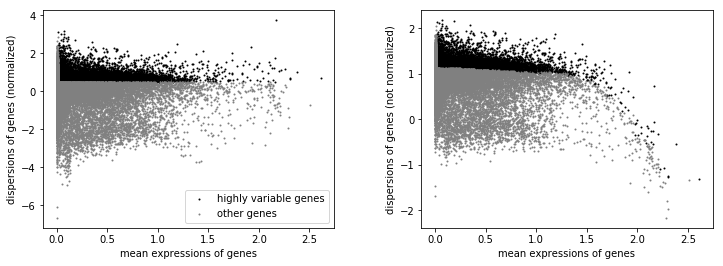

In [19]:
sc.pp.highly_variable_genes(adata)
sc.pl.highly_variable_genes(adata)

In [20]:
adata.var['highly_variable']['HLA-G']

False

We do not remove highly variable genes because we want to be able to plot HLA-G expression on the data set.

In [21]:
#adata = adata[:, adata.var['highly_variable']]

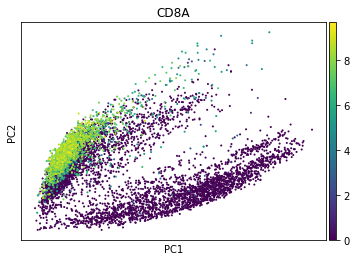

In [22]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca(adata, color='CD8A')

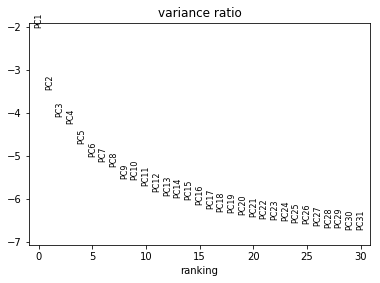

In [23]:
sc.pl.pca_variance_ratio(adata, log=True)

In [24]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.tsne(adata)
sc.tl.louvain(adata)

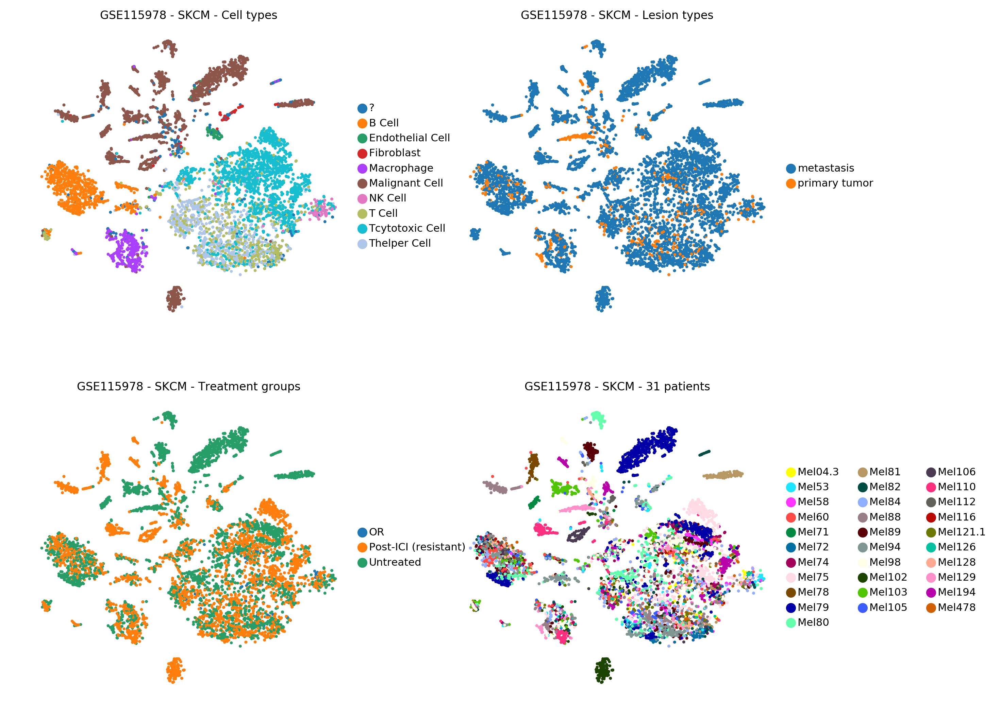

In [25]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=8)
sc.pl.tsne(adata, color=['cell_type', 'lesion_type', 'treatment_group', 'patient_id'], 
           title=['GSE115978 - SKCM - Cell types', 'GSE115978 - SKCM - Lesion types', 'GSE115978 - SKCM - Treatment groups',
                 'GSE115978 - SKCM - {} patients'.format(len(adata.obs.patient_id.unique()))], ncols=2)

In [26]:
adata.write_h5ad(ANNDATA_FNAME)

In [27]:
from pyscenic.binarization import binarize
from pyscenic.genesig import Regulon
from typing import Union, Sequence

def add_scenic_metadata(adata: sc.AnnData, 
               auc_mtx: pd.DataFrame, 
               regulons: Union[None, Sequence[Regulon]] = None,
               bin_rep: bool = False,
               copy: bool = False) -> sc.AnnData:
    """
    Add AUCell values to AnnData object.
    
    :param adata: The AnnData object.
    :param auc_mtx: The dataframe containing the AUCell values (#observations x #regulons).
    :param bin_rep: Also add binarized version of AUCell values as separate representation. This representation
    is stored as `adata.obsm['X_aucell_bin']`.
    :param copy: Return a copy instead of writing to adata.
    :
    """
    assert isinstance(adata, sc.AnnData)
    assert isinstance(auc_mtx, pd.DataFrame)
    assert len(auc_mtx) == adata.n_obs
    
    REGULON_SUFFIX_PATTERN = 'Regulon({})'
    
    result = adata.copy() if copy else adata
    
    # Add AUCell values as new representation (similar to a PCA). This facilitates the usage of
    # AUCell as initial dimensional reduction.
    result.obsm['X_aucell'] = auc_mtx.values.copy()
    if bin_rep:
        bin_mtx, _ = binarize(auc_mtx)
        result.obsm['X_aucell_bin'] = bin_mtx.values
        
    # Encode genes in regulons as "binary" membership matrix.
    if regulons is not None:
        genes = np.array(adata.var_names)
        data = np.zeros(shape=(adata.n_vars, len(regulons)), dtype=bool)
        for idx, regulon in enumerate(regulons):
            data[:, idx] = np.isin(genes, regulon.genes).astype(bool)
        regulon_assignment = pd.DataFrame(data=data, index=genes,
                                          columns=list(map(lambda r: REGULON_SUFFIX_PATTERN.format(r.name), regulons)))
        result.var = pd.merge(result.var, regulon_assignment, left_index=True, right_index=True, how='left')
    
    # Add additional meta-data/information on the regulons.
    def fetch_logo(context):
        for elem in context:
            if elem.endswith('.png'):
                return elem
        return ""
    result.uns['aucell'] = {
        'regulon_names': auc_mtx.columns.map(lambda s: REGULON_SUFFIX_PATTERN.format(s)).values,
        'regulon_motifs': np.array([fetch_logo(reg.context) for reg in regulons] if regulons is not None else []) 
        }
    
    # Add the AUCell values also as annotations of observations. This way regulon activity can be
    # depicted on cellular scatterplots.
    mtx = auc_mtx.copy()
    mtx.columns = result.uns['aucell']['regulon_names']
    result.obs = pd.merge(result.obs, mtx, left_index=True, right_index=True, how='left')
    
    return result

In [28]:
with open(REGULONS_DAT_FNAME, 'rb') as f:
    regulons = pickle.load(f)

In [29]:
add_scenic_metadata(adata, pd.read_csv(AUCELL_MTX_FNAME, index_col=0), regulons, bin_rep=True)

AnnData object with n_obs × n_vars = 7186 × 22527 
    obs: 'sample_id', 'cell_type', 'cohort', 'patient_id', 'age', 'sex', 'treatment', 'treatment_group', 'lesion_type', 'site', 'aDC', 'Adipocytes', 'Astrocytes', 'B-cells', 'Basophils', 'CD4+ memory T-cells', 'CD4+ naive T-cells', 'CD4+ T-cells', 'CD4+ Tcm', 'CD4+ Tem', 'CD8+ naive T-cells', 'CD8+ T-cells', 'CD8+ Tcm', 'CD8+ Tem', 'cDC', 'Chondrocytes', 'Class-switched memory B-cells', 'CLP', 'CMP', 'DC', 'Endothelial cells', 'Eosinophils', 'Epithelial cells', 'Erythrocytes', 'Fibroblasts', 'GMP', 'Hepatocytes', 'HSC', 'iDC', 'Keratinocytes', 'ly Endothelial cells', 'Macrophages', 'Macrophages M1', 'Macrophages M2', 'Mast cells', 'Megakaryocytes', 'Melanocytes', 'Memory B-cells', 'MEP', 'Mesangial cells', 'Monocytes', 'MPP', 'MSC', 'mv Endothelial cells', 'Myocytes', 'naive B-cells', 'Neurons', 'Neutrophils', 'NK cells', 'NKT', 'Osteoblast', 'pDC', 'Pericytes', 'Plasma cells', 'Platelets', 'Preadipocytes', 'pro B-cells', 'Sebocytes', 

In [30]:
adata.var.index[adata.var['Regulon(MITF)']]

Index(['APBB2', 'AEN', 'TOB2', 'SORL1', 'NAT10', 'USP6NL', 'SLC25A46', 'PHF20',
       'GDPD5', 'ABR',
       ...
       'PTK6', 'PSME3', 'UAP1', 'KCNN4', 'MAT2A', 'SEMA4C', 'ARMCX2', 'PEPD',
       'ZNF358', 'SLC39A6'],
      dtype='object', length=1870)

In [31]:
adata.write_h5ad(ANNDATA_FNAME)

In [32]:
#export2loom(df_tpm.T, regulons, LOOM_FNAME,
#                cell_annotations=adata.obs['cell_type'].to_dict(),
#                tree_structure=(),
#                title='GSE115978',
#                nomenclature="HGNC", compress=True)

In [33]:
sc.tl.tsne(adata, use_rep='X_aucell')

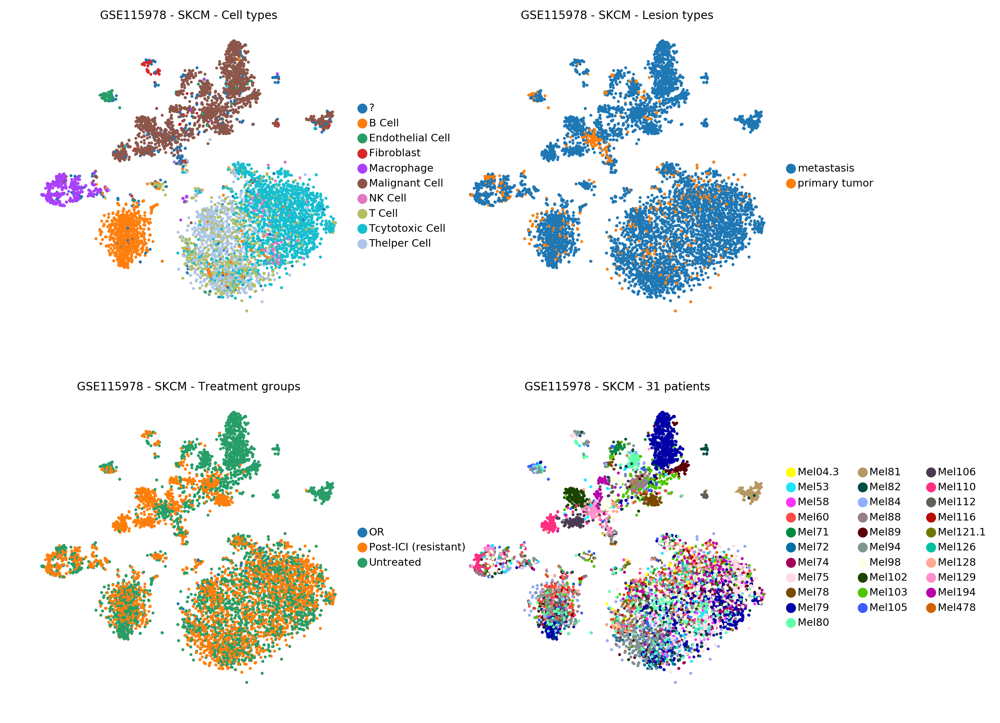

In [34]:
sc.pl.tsne(adata, color=['cell_type', 'lesion_type', 'treatment_group', 'patient_id'], 
           title=['GSE115978 - SKCM - Cell types', 'GSE115978 - SKCM - Lesion types', 'GSE115978 - SKCM - Treatment groups',
                 'GSE115978 - SKCM - {} patients'.format(len(adata.obs.patient_id.unique()))], ncols=2, use_raw=False)

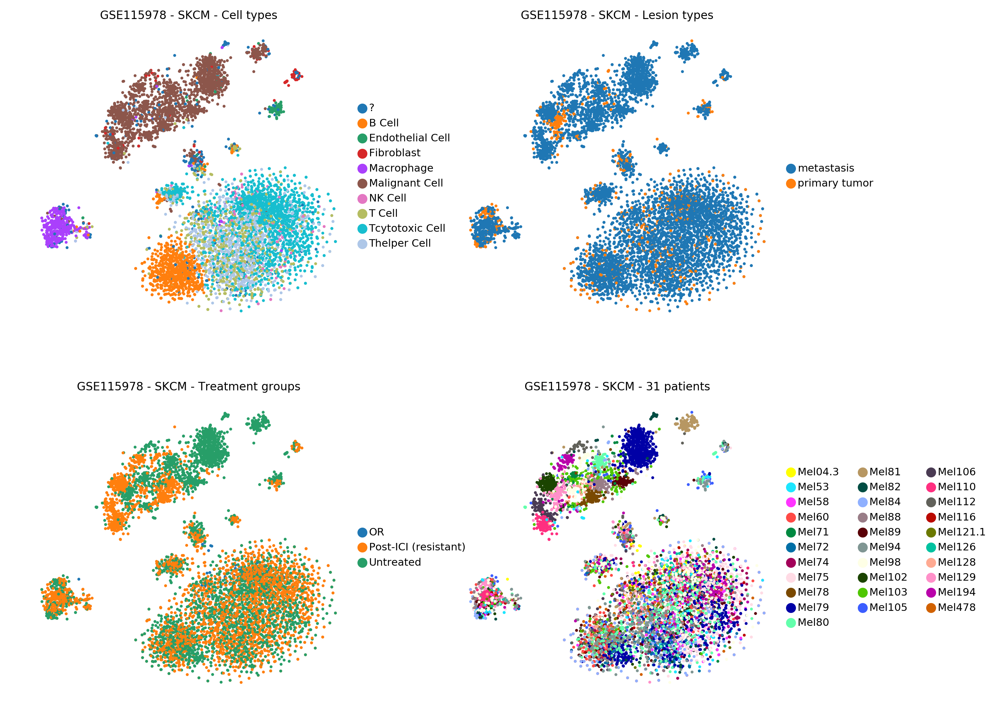

In [35]:
sc.tl.tsne(adata, use_rep='X_aucell_bin')
sc.pl.tsne(adata, color=['cell_type', 'lesion_type', 'treatment_group', 'patient_id'], 
           title=['GSE115978 - SKCM - Cell types', 'GSE115978 - SKCM - Lesion types', 'GSE115978 - SKCM - Treatment groups',
                 'GSE115978 - SKCM - {} patients'.format(len(adata.obs.patient_id.unique()))], ncols=2, use_raw=False)

In [36]:
sc.tl.tsne(adata, use_rep='X_aucell')

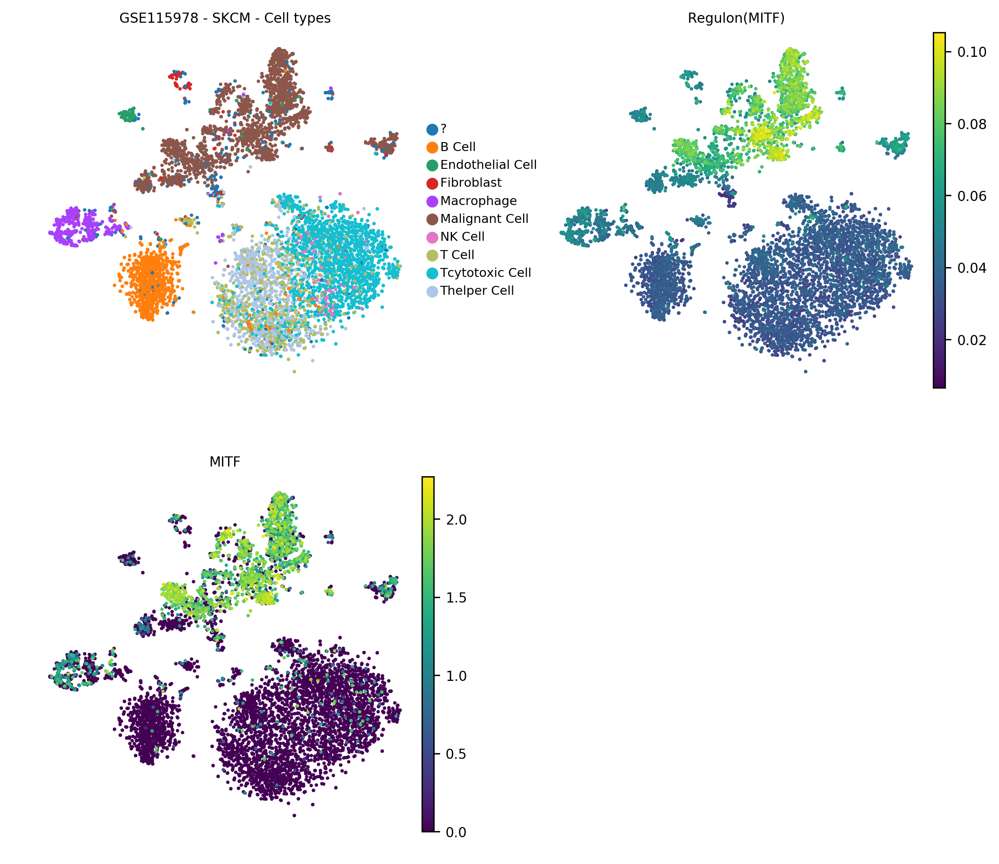

In [37]:
sc.pl.tsne(adata, color=['cell_type', 'Regulon(MITF)', 'MITF'], 
           title=['GSE115978 - SKCM - Cell types', 'Regulon(MITF)', 'MITF'], ncols=2, use_raw=False)

In [39]:
aucell_adata = sc.AnnData(X=pd.read_csv(AUCELL_MTX_FNAME, index_col=0).sort_index())
aucell_adata.obs = df_obs

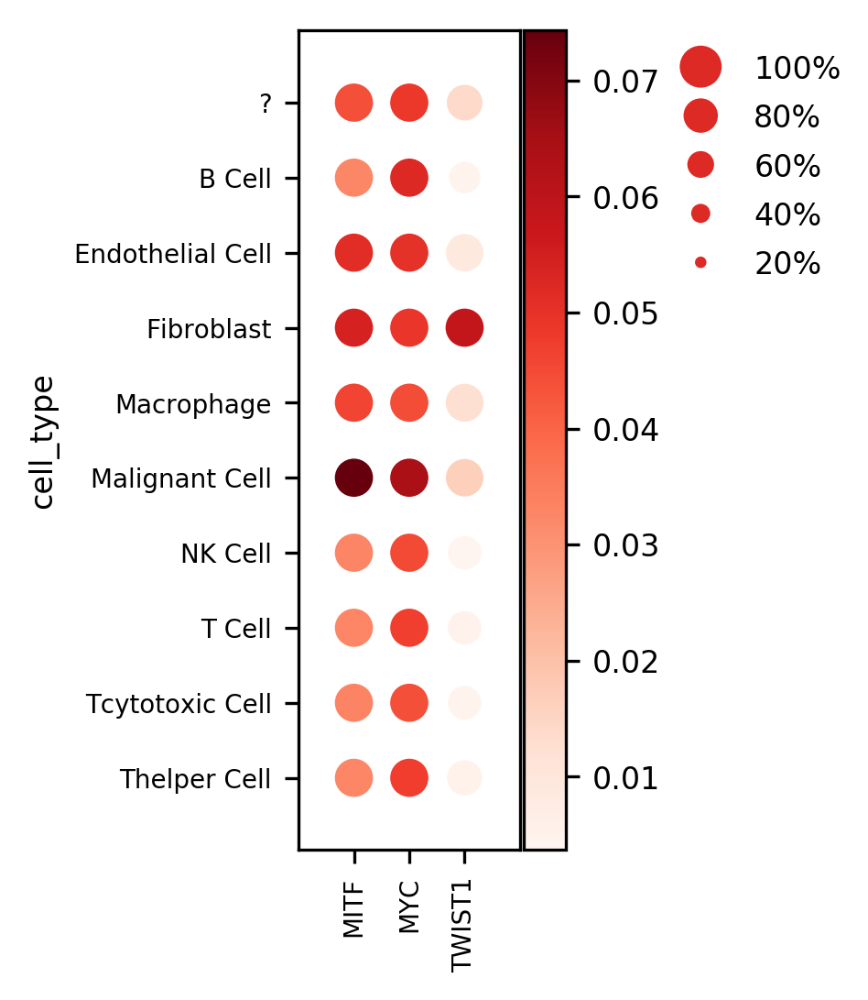

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[1.0499999999999998, 0, 0.2, 0.5, 0.25])

In [42]:
sc.pl.dotplot(aucell_adata, ['MITF', 'MYC', 'TWIST1'], groupby='cell_type')

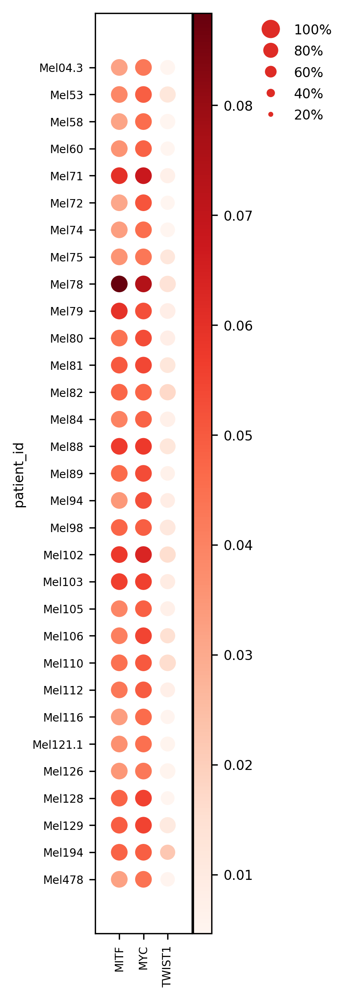

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[1.0499999999999998, 0, 0.2, 0.5, 0.25])

In [43]:
sc.pl.dotplot(aucell_adata,  ['MITF', 'MYC', 'TWIST1'], groupby='patient_id')

# GSE97693 - Colorectal adenocarcinoma (COAD & READ)

_Publication:_

Single-cell multiomics sequencing and analyses of human colorectal cancer

Shuhui Bian, Yu Hou, Xin Zhou, Xianlong Li, Jun Yong, Yicheng Wang, Wendong Wang, Jia Yan, Boqiang Hu, Hongshan Guo, Jilian Wang, Shuai Gao, Yunuo Mao, Ji Dong, Ping Zhu, Dianrong Xiu, Liying Yan, Lu Wen, Jie Qiao, Fuchou Tang, Wei Fu

Although genomic instability, epigenetic abnormality, and gene expression dysregulation are hallmarks of colorectal cancer, these features have not been simultaneously analyzed at single-cell resolution. Using optimized single-cell multiomics sequencing together with multiregional sampling of the primary tumor and lymphatic and distant metastases, we developed insights beyond intratumoral heterogeneity. Genome-wide DNA methylation levels were relatively consistent within a single genetic sublineage. The genome-wide DNA demethylation patterns of cancer cells were consistent in all 10 patients whose DNA we sequenced. The cancer cells’ DNA demethylation degrees clearly correlated with the densities of the heterochromatin-associated histone modification H3K9me3 of normal tissue and those of repetitive element long interspersed nuclear element 1. Our work demonstrates the feasibility of reconstructing genetic lineages and tracing their epigenomic and transcriptomic dynamics with single-cell multiomics sequencing.

Science 2018

https://dx.doi.org/10.1126/science.aao3791


_Data set acquisition:_

https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE97693

_Remarks:_

1. Cell line data is removed (HEp-2).
2. Codes:

| Lesion type | Code |
| ----------- | ---- |
| Lymph node  | LN   |
| Primary Tumor | PT |
| Normal Colon | NC |
| Metastasis Liver | ML |
| Post-treatment liver metastasis | MP |

_Difficulties:_
1. We don't need the bisulfate sequencing experiment output for now. These datasets take up most of the volume so I opted for selectively acquiring only the RNA-Seq data.
2. Every cell is archived on GEO as a separate file.
3. Different units are use for transcript abundance: TPM and FPKM. Needs to converted. Cf. https://haroldpimentel.wordpress.com/2014/05/08/what-the-fpkm-a-review-rna-seq-expression-units/



In [35]:
GEO_ACCESSION = "GSE97693"
BASE_FOLDER = "/home/bramvds/Documents/datasets"
DATASET_FOLDER = os.path.join(BASE_FOLDER, GEO_ACCESSION)
WGET_LIST_FNAME = os.path.join(DATASET_FOLDER, "files.txt")
MTX_FNAME = os.path.join(DATASET_FOLDER, '{}.tpm.csv'.format(GEO_ACCESSION))
ANNOT_FNAME = os.path.join(DATASET_FOLDER, '{}.annotations.csv'.format(GEO_ACCESSION))
ANNDATA_FNAME = os.path.join(DATASET_FOLDER, 'GSE97693.h5ad')

EXP_MTX_QC_TPM_FNAME = os.path.join(BASE_FOLDER, 'GSE97693.qc.tpm.csv')
#AUCELL_MTX_FNAME = '/home/bramvds/Documents/scenic_resources/GSE97693.auc.csv'

__DATA DOWNLOAD__

Compile list of datasets that capture mRNA abundances from single cells. 

In [ ]:
gse = GEOparse.get_GEO(geo=GEO_ACCESSION, destdir=BASE_FOLDER)
with open(WGET_LIST_FNAME, 'wt') as f:
    for gsm_name, gsm in gse.gsms.items():
        if gsm.metadata['library_strategy'][0] == 'RNA-Seq':
            print(gsm.metadata['supplementary_file_1'][0], file=f)

In [ ]:
!head {WGET_LIST_FNAME}

Use `wget --no-check-certificate -i files.txt` to download a whole list of files. And `gunzip` these files.

__METADATA CLEANING__

General pattern in the filename to be captured:
    
    GSM2696954_scTrioSeq2Rna_CRC01_LN1_161.FPKM
    GSM2575578_WholeCell_CCL23_1.FPKM.txt
    GSM3443113_scTrioSeq2Rna_scTrioSeq2Rna_CRC03_NC_292.TPM.txt

In [36]:
def parse_fname(fname):
    bname = os.path.basename(fname)
    annotations, unit, *_ = bname.split('.')
    elems = annotations.split('_')
    if len(elems) == 5:
        return elems[0], unit, elems[2], elems[3]
    if len(elems) == 6:
        return elems[0], unit, elems[3], elems[4]
    elif len(elems) == 4:
        return elems[0], unit, elems[2], ''
    else:
        raise ValueError(fname)

In [37]:
sample_id2patient_id = {}
sample_id2cell_type = {}
for fname in glob.glob(os.path.join(DATASET_FOLDER, '*.*.txt')):
    sample_id, _, patient_id, cell_type = parse_fname(fname)
    if patient_id.startswith('CCL'):
            continue
    sample_id2patient_id[sample_id] = patient_id
    sample_id2cell_type[sample_id] = cell_type[:2]

In [38]:
annotations = pd.concat([pd.Series(sample_id2patient_id, name='patient_id'), pd.Series(sample_id2cell_type, name='cell_type')], axis=1)

In [39]:
annotations = annotations.reset_index().rename(columns={'index': 'sample_id', 'cell_type': 'lesion_type'})

In [40]:
annotations.head()

,sample_id,patient_id,lesion_type
0,GSM2696955,CRC01,LN
1,GSM2696956,CRC01,LN
2,GSM2696957,CRC01,LN
3,GSM2696958,CRC01,LN
4,GSM2696959,CRC01,LN


In [41]:
annotations.to_csv(ANNOT_FNAME, sep=',')

__EXPRESSION MATRIX__

In [42]:
def load_column(fname):
    with open(fname, 'rt') as f:
        return pd.DataFrame([line.strip().split('\t') for line in f], dtype=float).rename(columns={0:'gene_id', 1:'abundance'}).set_index('gene_id')
    
def load_mtx(fnames):
    columns = []
    for fname in fnames:
        sample_id, _, patient_id, *_ = parse_fname(fname)
        if patient_id.startswith('CCL'):
            continue
        column = load_column(fname)
        column.columns = [sample_id]
        columns.append(column)
    return pd.concat(columns, axis=1)

In [43]:
mtx_tpm = load_mtx(glob.glob(os.path.join(DATASET_FOLDER, '*.TPM.txt')))
mtx_fpkm = load_mtx(glob.glob(os.path.join(DATASET_FOLDER, '*.FPKM.txt')))
mtx = pd.concat([(mtx_fpkm / mtx_fpkm.sum() * 1e6), mtx_tpm], axis=1, sort=True).fillna(0.0)

In [44]:
mtx_tpm.shape

(23457, 688)

In [45]:
mtx_fpkm.shape

(25372, 500)

In [46]:
mtx.shape

(25372, 1188)

In [47]:
mtx.head()

,GSM2696955,GSM2696956,GSM2696957,GSM2696958,GSM2696959,GSM2696960,GSM2696961,GSM2696962,GSM2696963,GSM2696964,...,GSM3443122,GSM3443123,GSM3443124,GSM3443125,GSM3443126,GSM3443127,GSM3443128,GSM3443129,GSM3443130,GSM3443131
A1BG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0
A1BG-AS1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0
A1CF,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.062835,0.111679,0.0,...,0.0,1163.87,0.0,0.0,60.26,0.0,0.0,0.0,255.24,0.0
A2M,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0
A2M-AS1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0


In [48]:
mtx.to_csv(MTX_FNAME, sep=',', index=True)

__ANNDATA__

In [49]:
adata = sc.AnnData(X=mtx.T.sort_index())
adata.obs = annotations.set_index('sample_id').sort_index()
adata.var_names_make_unique()
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
adata.raw = adata #Store non-log transformed data as raw. This data can be used via the use_raw parameters available for many functions.
sc.pp.log1p(adata)
adata

AnnData object with n_obs × n_vars = 1188 × 20012 
    obs: 'patient_id', 'lesion_type', 'n_genes'
    var: 'n_cells'

In [50]:
adata.write_h5ad(ANNDATA_FNAME)

... storing 'patient_id' as categorical
... storing 'lesion_type' as categorical


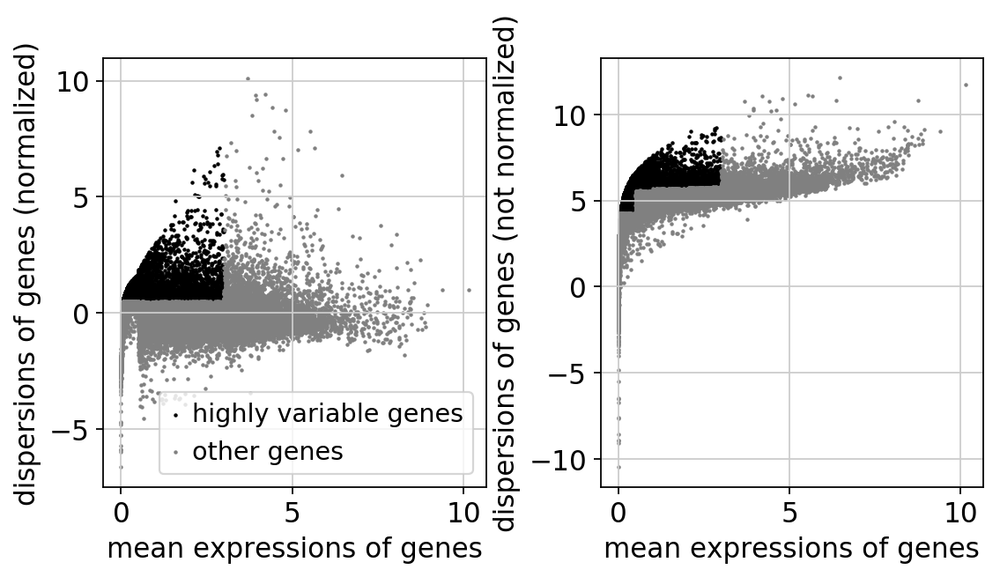

In [51]:
sc.set_figure_params()
sc.pp.highly_variable_genes(adata)
sc.pl.highly_variable_genes(adata)

In [52]:
adata.var['highly_variable']['HLA-G']

True

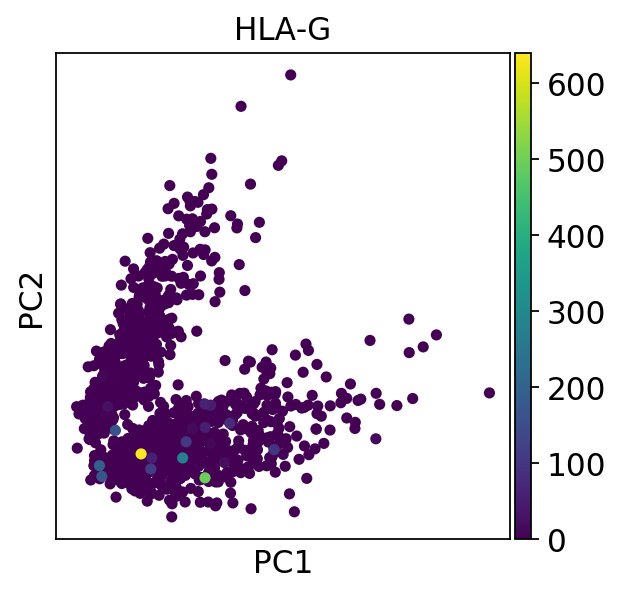

In [53]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca(adata, color='HLA-G')

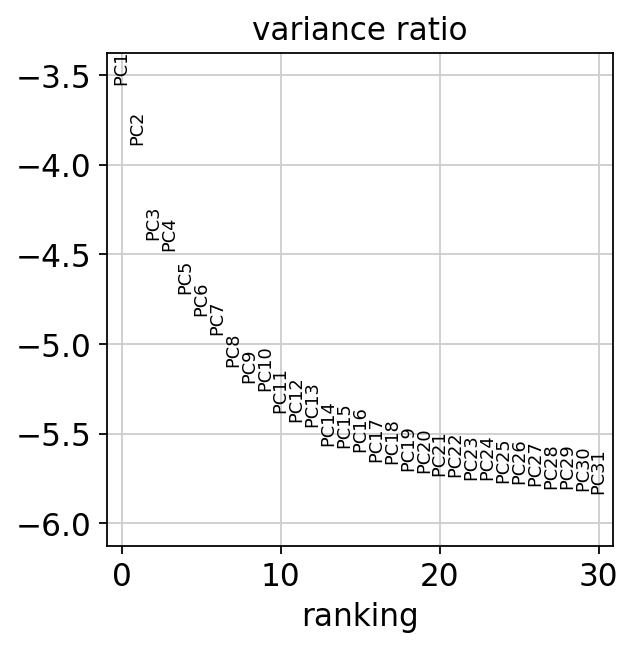

In [54]:
sc.pl.pca_variance_ratio(adata, log=True)

In [55]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.tsne(adata)
sc.tl.louvain(adata)

In [56]:
adata.write_h5ad(ANNDATA_FNAME)

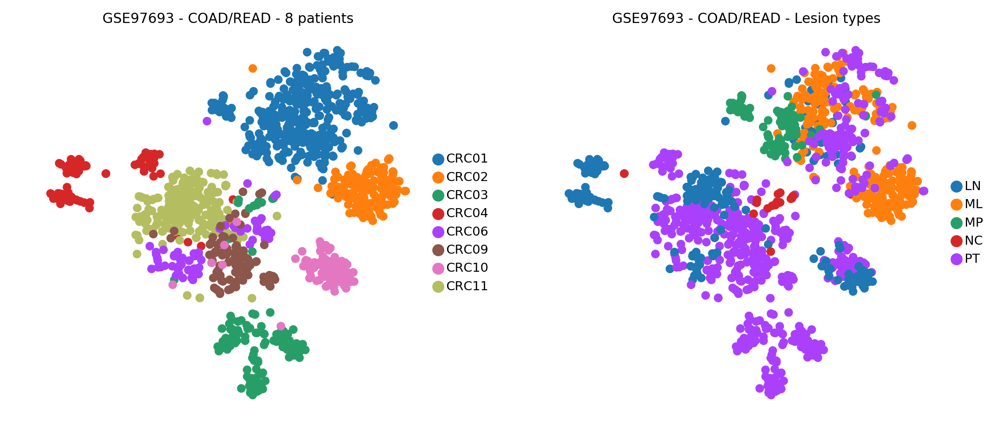

In [57]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=8)
sc.pl.tsne(adata, color=['patient_id', 'lesion_type'], title=['GSE97693 - COAD/READ - {} patients'.format(len(adata.obs.patient_id.unique())), 'GSE97693 - COAD/READ - Lesion types'])

In [58]:
adata.to_df().to_csv(EXP_MTX_QC_TPM_FNAME)

First display number of cells available according to patient and lesion type.

In [60]:
df_sizes = pd.pivot_table(annotations, values='sample_id', index=['lesion_type'], columns=['patient_id'], aggfunc=len).fillna(0.0)
df_sizes

patient_id,CRC01,CRC02,CRC03,CRC04,CRC06,CRC09,CRC10,CRC11
lesion_type,,,,,,,,
LN,40.0,0.0,1.0,63.0,21.0,0.0,36.0,63.0
ML,113.0,113.0,0.0,0.0,0.0,0.0,0.0,0.0
MP,102.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
NC,1.0,0.0,13.0,2.0,1.0,3.0,0.0,0.0
PT,110.0,21.0,130.0,28.0,50.0,99.0,49.0,129.0


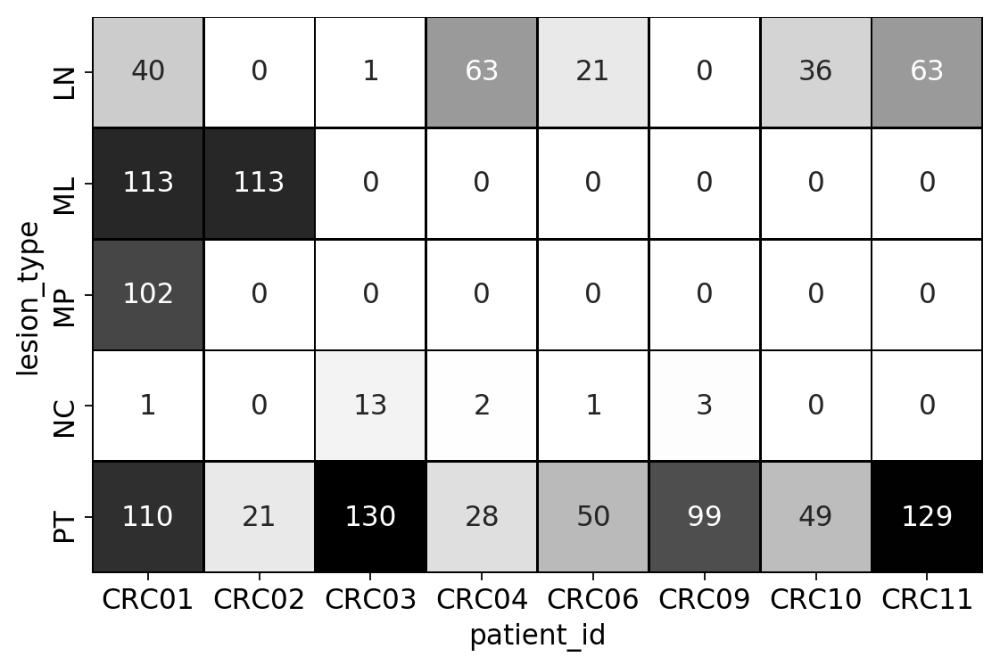

In [61]:
sc.set_figure_params()
fig, ax1 = plt.subplots(nrows=1, ncols=1, figsize=(8,6))
sns.heatmap(df_sizes, linecolor='k', linewidths=.8, cmap="Greys", square=True, cbar=False, annot=True, fmt='.0f', ax=ax1)

In [62]:
adata = ad.read_h5ad(ANNDATA_FNAME)

In [63]:
len(adata.obs)

1188

# GSE103322 - Head and Neck Squamous Cell Carcinoma (HNSC)

_Publication:_

Single-Cell Transcriptomic Analysis of Primary and Metastatic Tumor Ecosystems in Head and Neck Cancer

Sidharth V Puram, Itay Tirosh, Anuraag S Parikh, Anoop P Patel, Keren Yizhak, Shawn Gillespie, Christopher Rodman, Christina L Luo, Edmund A Mroz, Kevin S Emerick, Daniel G Deschler, Mark A Varvares, Ravi Mylvaganam, Orit Rozenblatt-Rosen, James W Rocco, William C Faquin, Derrick T Lin, Aviv Regev, Bradley E Bernstein

The diverse malignant, stromal, and immune cells in tumors affect growth, metastasis, and response to therapy. We profiled transcriptomes of ∼6,000 single cells from 18 head and neck squamous cell carcinoma (HNSCC) patients, including five matched pairs of primary tumors and lymph node metastases. Stromal and immune cells had consistent expression programs across patients. Conversely, malignant cells varied within and between tumors in their expression of signatures related to cell cycle, stress, hypoxia, epithelial differentiation, and partial epithelial-to-mesenchymal transition (p-EMT). Cells expressing the p-EMT program spatially localized to the leading edge of primary tumors. By integrating single-cell transcriptomes with bulk expression profiles for hundreds of tumors, we refined HNSCC subtypes by their malignant and stromal composition and established p-EMT as an independent predictor of nodal metastasis, grade, and adverse pathologic features. Our results provide insight into the HNSCC ecosystem and define stromal interactions and a p-EMT program associated with metastasis.

Cell 2017

https://dx.doi.org/10.1016/j.cell.2017.10.044

_Data set acquisition:_

https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE103322


In [44]:
GEO_ACCESSION = "GSE103322"
BASE_FOLDER = "/home/bramvds/Documents/datasets"
DATASET_FOLDER = os.path.join(BASE_FOLDER, GEO_ACCESSION)
MTX_FNAME = os.path.join(DATASET_FOLDER, '{}.tpm.csv'.format(GEO_ACCESSION))
ANNOT_FNAME = os.path.join(DATASET_FOLDER, '{}.annotations.csv'.format(GEO_ACCESSION))
METADATA_FNAME = os.path.join(DATASET_FOLDER, '{}.metadata.csv'.format(GEO_ACCESSION))
SCORES_MTX_FNAME = os.path.join(DATASET_FOLDER, '{}.scores.csv'.format(GEO_ACCESSION))
ANNDATA_FNAME = os.path.join(DATASET_FOLDER, '{}.h5ad'.format(GEO_ACCESSION))

MTX_QC_FNAME = os.path.join(DATASET_FOLDER, '{}.qc.tpm.csv'.format(GEO_ACCESSION))
AUCELL_MTX_FNAME = '/home/bramvds/Documents/scenic_resources/{}.auc.csv'.format(GEO_ACCESSION)
REGULONS_DAT_FNAME = '/home/bramvds/Documents/scenic_resources/{}.regulons.dat'.format(GEO_ACCESSION)

__EXPRESSION MATRIX__

In [45]:
def process_gse103322(fname):
    # Load CSV file
    mtx = pd.read_csv(os.path.join(DATASET_FOLDER, fname), sep='\t', index_col=0, skiprows=[1,2,3,4,5])
    
    # Extract gene symbol
    mtx.index = list(map(lambda g: g[1:-1], mtx.index))
    
    # Remove duplicate gene symbols (keep last when sorted ascending order according to row sum)
    mtx = mtx.iloc[mtx.sum(axis=1).argsort()]
    mtx = mtx[~mtx.index.duplicated(keep='last')]
    
    return mtx

In [46]:
mtx = process_gse103322('GSE103322_HNSCC_all_data.txt')

In [47]:
mtx.head()

,HN28_P15_D06_S330_comb,HN28_P6_G05_S173_comb,HN26_P14_D11_S239_comb,HN26_P14_H05_S281_comb,HN26_P25_H09_S189_comb,HN26_P14_H06_S282_comb,HN25_P25_C04_S316_comb,HN26_P25_A11_S107_comb,HN26_P25_C09_S129_comb,HNSCC26_P24_H05_S377_comb,...,HNSCC20_P3_B10_S22_comb,HNSCC20_P13_B11_S215_comb,HNSCC20_P3_C08_S32_comb,HNSCC17_P4_H03_S183_comb,HNSCC20_P3_F09_S69_comb,HNSCC17_P4_G12_S180_comb,HNSCC20_P13_C05_S221_comb,HNSCC17_P4_C12_S132_comb,HNSCC20_P3_H08_S92_comb,HNSCC20_P3_G06_S78_comb
MIR3529,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SNORD113-9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MAGEB16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MIR4633,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SNORA49,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [48]:
mtx.to_csv(MTX_FNAME, index=True)

__METADATA CLEANING__

In [49]:
cell_annotations = pd.read_csv(os.path.join(DATASET_FOLDER, 'GSE103322_HNSCC_all_data.txt'), sep='\t', index_col=0, low_memory=False).head(5)

In [50]:
cell_annotations

,HN28_P15_D06_S330_comb,HN28_P6_G05_S173_comb,HN26_P14_D11_S239_comb,HN26_P14_H05_S281_comb,HN26_P25_H09_S189_comb,HN26_P14_H06_S282_comb,HN25_P25_C04_S316_comb,HN26_P25_A11_S107_comb,HN26_P25_C09_S129_comb,HNSCC26_P24_H05_S377_comb,...,HNSCC20_P3_B10_S22_comb,HNSCC20_P13_B11_S215_comb,HNSCC20_P3_C08_S32_comb,HNSCC17_P4_H03_S183_comb,HNSCC20_P3_F09_S69_comb,HNSCC17_P4_G12_S180_comb,HNSCC20_P13_C05_S221_comb,HNSCC17_P4_C12_S132_comb,HNSCC20_P3_H08_S92_comb,HNSCC20_P3_G06_S78_comb
processed by Maxima enzyme,1,1,1.0,1,1.0,1.0,1.0,1,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Lymph node,1,0,1.0,1,1.0,1.0,1.0,1,1.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
classified as cancer cell,0,0,1.0,0,1.0,1.0,1.0,0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0
classified as non-cancer cells,1,1,0.0,1,0.0,0.0,0.0,1,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
non-cancer cell type,Fibroblast,Fibroblast,0.0,Fibroblast,0.0,0.0,0.0,Fibroblast,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [51]:
cell_type = pd.Series(data=list(map(lambda t: t[0] if t[1] else 'Malignant Cell',
                                    zip(cell_annotations.T['non-cancer cell type'], 
                                        cell_annotations.T['classified as non-cancer cells'].map(float).map(bool)))),
                      index = cell_annotations.columns, name='cell_type').replace({'-Fibroblast': 'Fibroblast',
                  'myocyte': 'Myocyte',
                  'Endothelial': 'Endothelial Cell',
                  'Dendritic': 'Dendritic Cell',
                  'Mast': 'Mast Cell',
                  'T cell': 'T Cell',
                  'B cell': 'B Cell'})

In [52]:
lesion_type = pd.Series(data=list(map(lambda t: 'Lymph node' if t else 'Primary tumor',
                                    cell_annotations.T['Lymph node'].map(float).map(bool))),
                      index = cell_annotations.columns, name='lesion_type')

In [53]:
def clean_pid(s: str) -> str:
    m = re.match("HN(SCC)?_?(\d{1,2})_", s)
    if m:
        return 'MEEI{}'.format(int(m.group(2)))
    else:
        return 'MEEI9'

In [54]:
patient_id = pd.Series(data=cell_annotations.columns.map(clean_pid), index = cell_annotations.columns, name='patient_id')

In [55]:
df_metadata = pd.concat([cell_type, lesion_type, patient_id], axis=1).reset_index().rename(columns={'index': 'cell_id'})

In [56]:
df_metadata.to_csv(ANNOT_FNAME, sep=',')

__ANNDATA__

In [57]:
df_scores = pd.read_csv(SCORES_MTX_FNAME, index_col=0)

In [58]:
df_obs = pd.merge(df_metadata.set_index('cell_id'), df_scores.T, left_index=True, right_index=True).sort_index()

In [59]:
adata = sc.AnnData(X=mtx.T.sort_index())
adata.obs = df_obs
adata.var_names_make_unique()
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
adata.raw = adata #Store non-log transformed data as raw. This data can be used via the use_raw parameters available for many functions.
sc.pp.log1p(adata)
adata

AnnData object with n_obs × n_vars = 5902 × 21519 
    obs: 'cell_type', 'lesion_type', 'patient_id', 'aDC', 'Adipocytes', 'Astrocytes', 'B-cells', 'Basophils', 'CD4+ memory T-cells', 'CD4+ naive T-cells', 'CD4+ T-cells', 'CD4+ Tcm', 'CD4+ Tem', 'CD8+ naive T-cells', 'CD8+ T-cells', 'CD8+ Tcm', 'CD8+ Tem', 'cDC', 'Chondrocytes', 'Class-switched memory B-cells', 'CLP', 'CMP', 'DC', 'Endothelial cells', 'Eosinophils', 'Epithelial cells', 'Erythrocytes', 'Fibroblasts', 'GMP', 'Hepatocytes', 'HSC', 'iDC', 'Keratinocytes', 'ly Endothelial cells', 'Macrophages', 'Macrophages M1', 'Macrophages M2', 'Mast cells', 'Megakaryocytes', 'Melanocytes', 'Memory B-cells', 'MEP', 'Mesangial cells', 'Monocytes', 'MPP', 'MSC', 'mv Endothelial cells', 'Myocytes', 'naive B-cells', 'Neurons', 'Neutrophils', 'NK cells', 'NKT', 'Osteoblast', 'pDC', 'Pericytes', 'Plasma cells', 'Platelets', 'Preadipocytes', 'pro B-cells', 'Sebocytes', 'Skeletal muscle', 'Smooth muscle', 'Tgd cells', 'Th1 cells', 'Th2 cells', 'T

In [60]:
adata.write_h5ad(ANNDATA_FNAME)

... storing 'cell_type' as categorical
... storing 'lesion_type' as categorical
... storing 'patient_id' as categorical


In [61]:
adata.to_df().to_csv(MTX_QC_FNAME)

__ADD DIMENSIONAL REDUCTIONS__

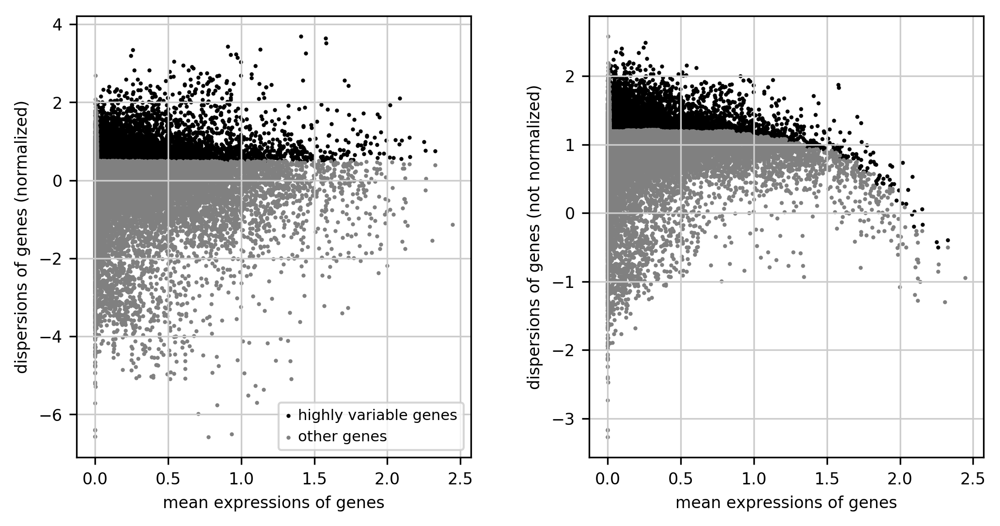

In [62]:
sc.pp.highly_variable_genes(adata)
sc.pl.highly_variable_genes(adata)

In [63]:
adata.var['highly_variable']['HLA-G']

False

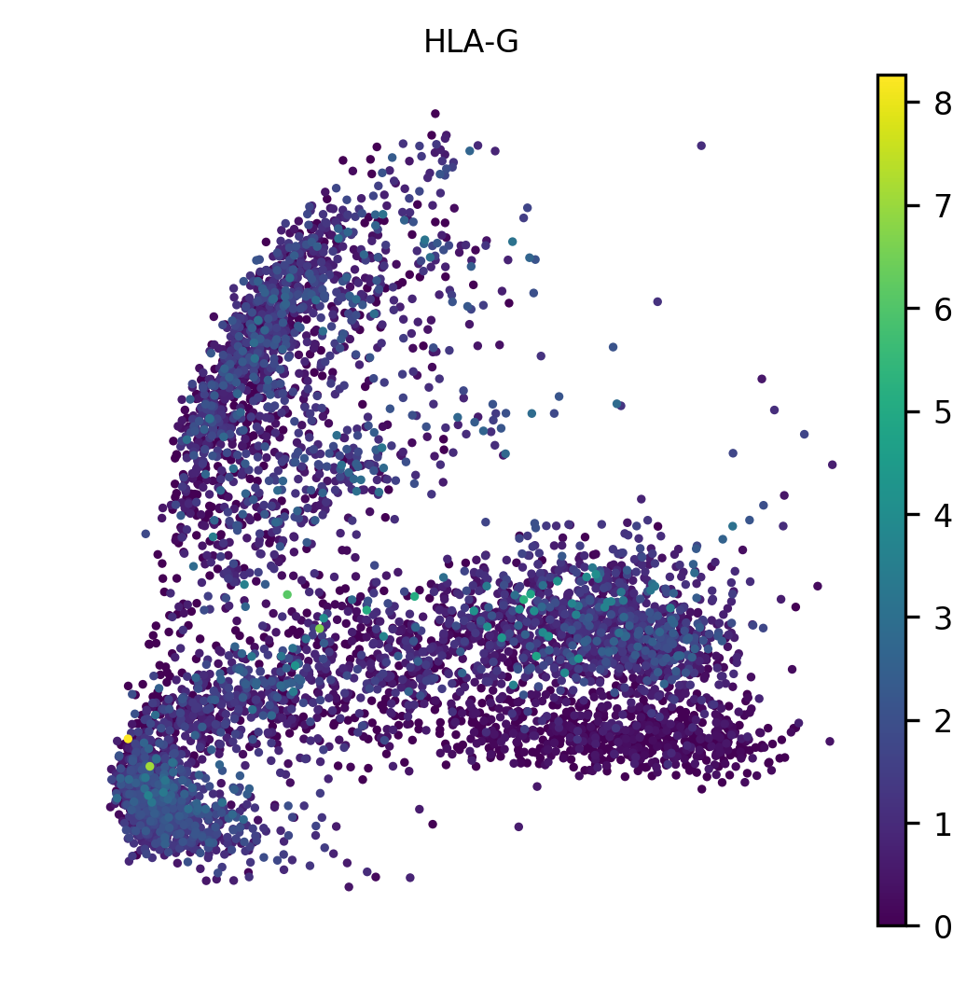

In [64]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca(adata, color='HLA-G')

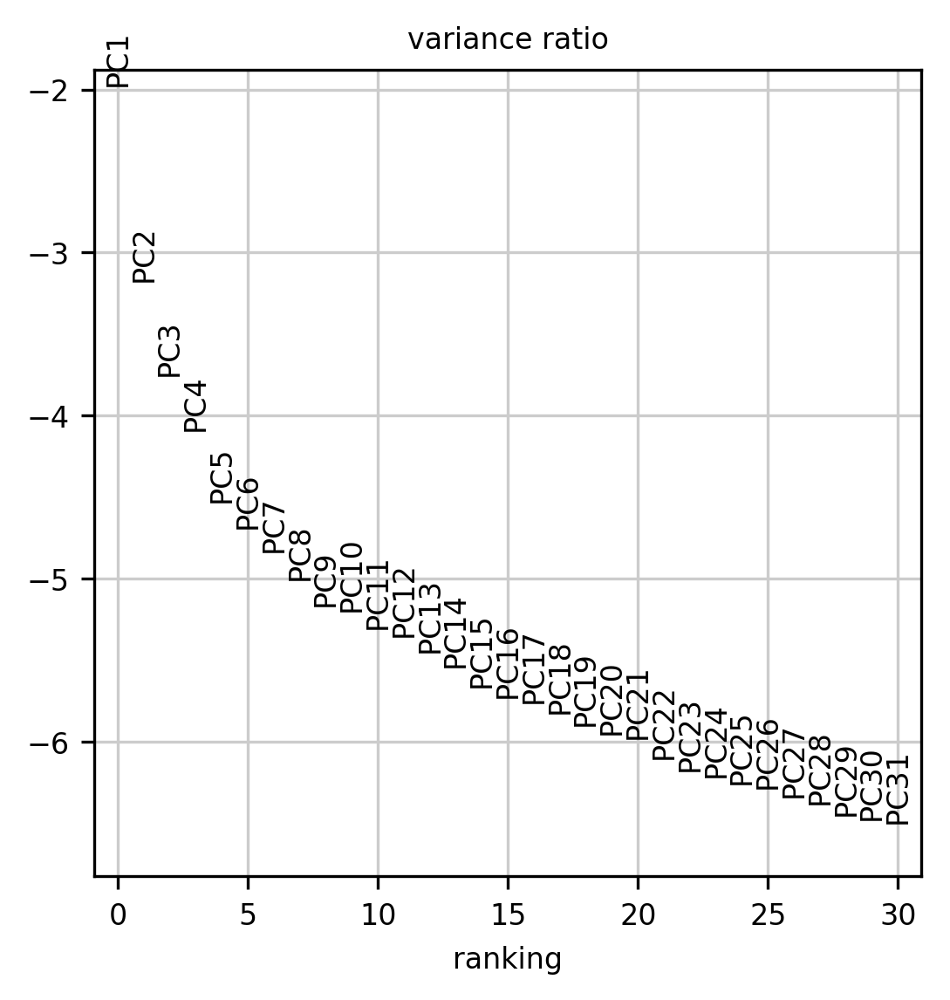

In [65]:
sc.pl.pca_variance_ratio(adata, log=True)

In [66]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.tsne(adata)
sc.tl.louvain(adata)

In [67]:
adata.write_h5ad(ANNDATA_FNAME)

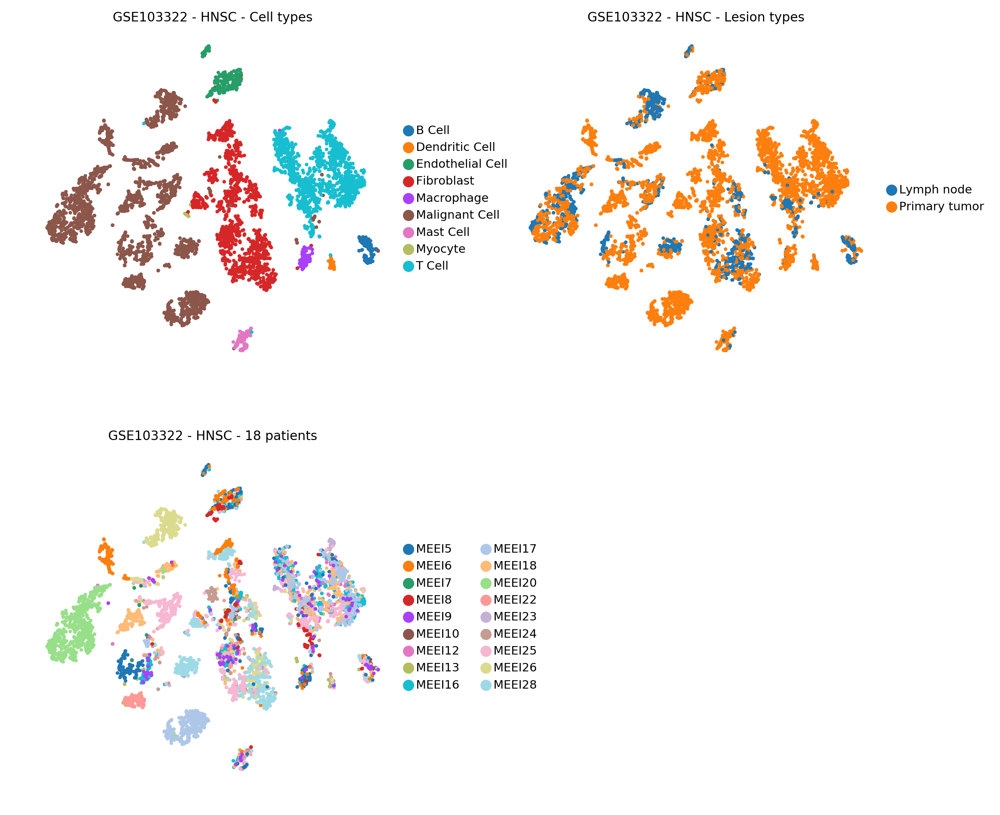

In [68]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=8)
sc.pl.tsne(adata, color=['cell_type', 'lesion_type','patient_id'], 
           title=['GSE103322 - HNSC - Cell types', 'GSE103322 - HNSC - Lesion types',
                 'GSE103322 - HNSC - {} patients'.format(len(adata.obs.patient_id.unique()))], ncols=2)

In [69]:
auc_mtx = pd.read_csv(AUCELL_MTX_FNAME, index_col=0)

In [70]:
with open(REGULONS_DAT_FNAME, 'rb') as f:
    regulons = pickle.load(f)

In [71]:
add_scenic_metadata(adata, auc_mtx, regulons)

AnnData object with n_obs × n_vars = 5902 × 21519 
    obs: 'cell_type', 'lesion_type', 'patient_id', 'aDC', 'Adipocytes', 'Astrocytes', 'B-cells', 'Basophils', 'CD4+ memory T-cells', 'CD4+ naive T-cells', 'CD4+ T-cells', 'CD4+ Tcm', 'CD4+ Tem', 'CD8+ naive T-cells', 'CD8+ T-cells', 'CD8+ Tcm', 'CD8+ Tem', 'cDC', 'Chondrocytes', 'Class-switched memory B-cells', 'CLP', 'CMP', 'DC', 'Endothelial cells', 'Eosinophils', 'Epithelial cells', 'Erythrocytes', 'Fibroblasts', 'GMP', 'Hepatocytes', 'HSC', 'iDC', 'Keratinocytes', 'ly Endothelial cells', 'Macrophages', 'Macrophages M1', 'Macrophages M2', 'Mast cells', 'Megakaryocytes', 'Melanocytes', 'Memory B-cells', 'MEP', 'Mesangial cells', 'Monocytes', 'MPP', 'MSC', 'mv Endothelial cells', 'Myocytes', 'naive B-cells', 'Neurons', 'Neutrophils', 'NK cells', 'NKT', 'Osteoblast', 'pDC', 'Pericytes', 'Plasma cells', 'Platelets', 'Preadipocytes', 'pro B-cells', 'Sebocytes', 'Skeletal muscle', 'Smooth muscle', 'Tgd cells', 'Th1 cells', 'Th2 cells', 'T

In [72]:
adata.write_h5ad(ANNDATA_FNAME)

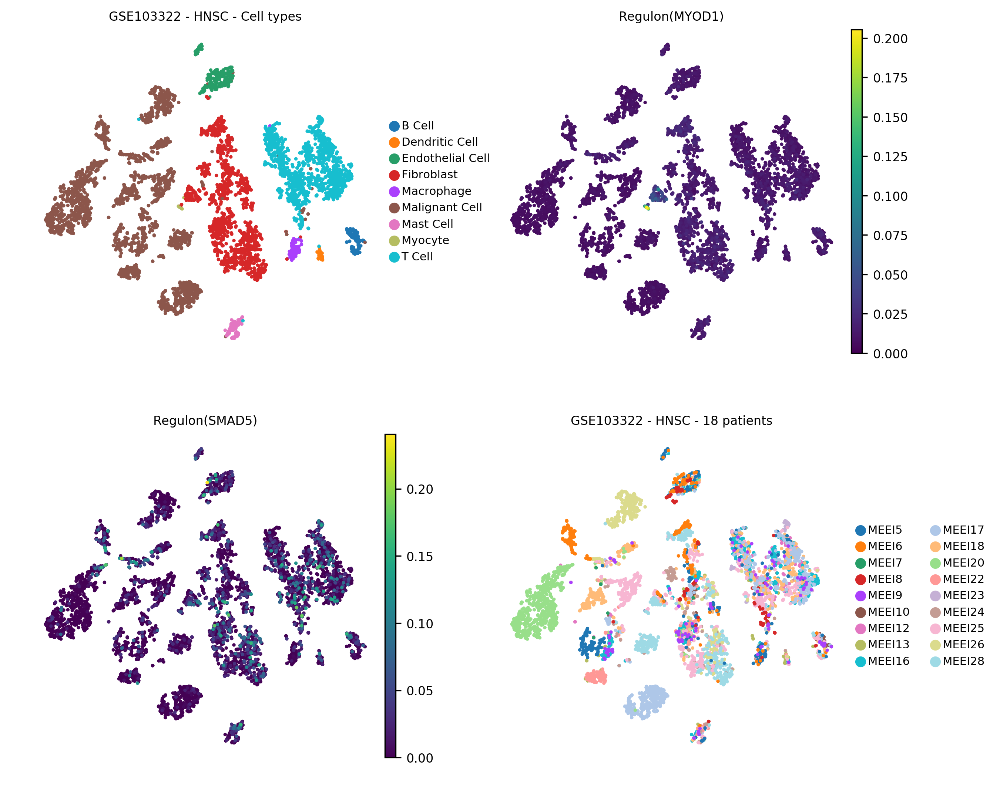

In [79]:
sc.pl.tsne(adata, color=['cell_type',  'Regulon(MYOD1)', 'Regulon(SMAD5)', 'patient_id'], 
           title=['GSE103322 - HNSC - Cell types',  'Regulon(MYOD1)','Regulon(SMAD5)',
                 'GSE103322 - HNSC - {} patients'.format(len(adata.obs.patient_id.unique()))], ncols=2)

In [ ]:
sc.tl.tsne(adata, use_rep='X_aucell', copy=True)

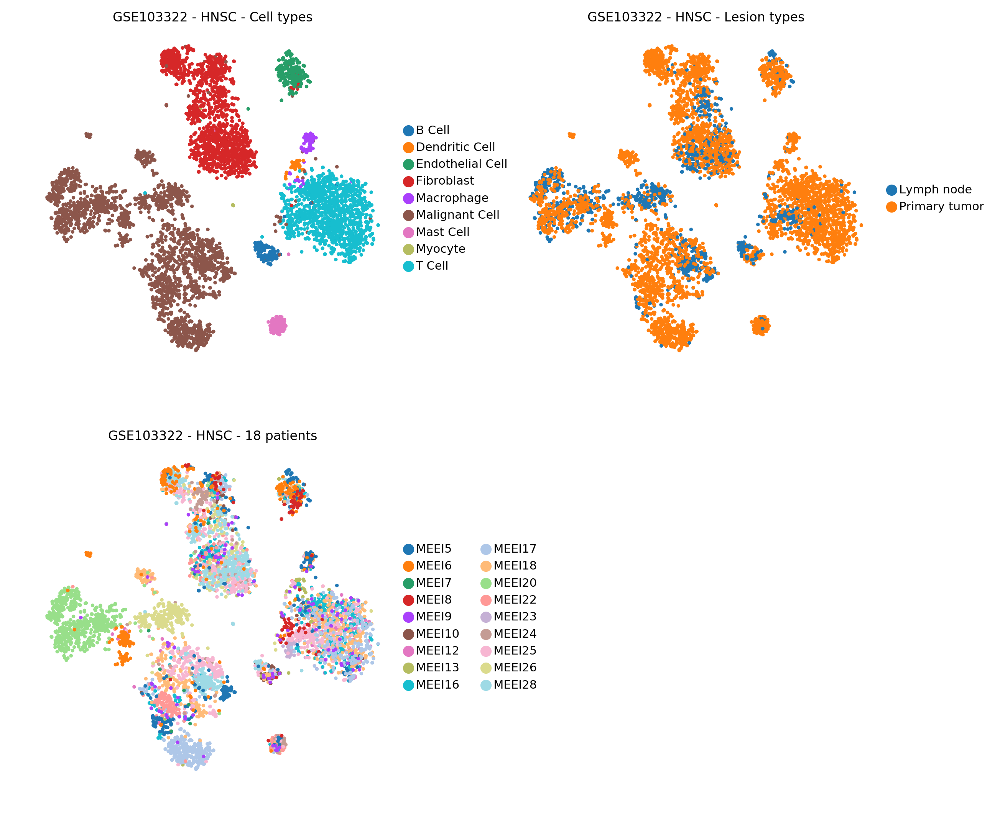

In [92]:
sc.pl.tsne(adata, color=['cell_type', 'lesion_type','patient_id'], 
           title=['GSE103322 - HNSC - Cell types', 'GSE103322 - HNSC - Lesion types',
                 'GSE103322 - HNSC - {} patients'.format(len(adata.obs.patient_id.unique()))], ncols=2)

In [ ]:
sc.pl.tsne(adata, color=['cell_type', 'lesion_type','patient_id'], 
           title=['GSE103322 - HNSC - Cell types', 'GSE103322 - HNSC - Lesion types',
                 'GSE103322 - HNSC - {} patients'.format(len(adata.obs.patient_id.unique()))], ncols=2)

# E-MTAB-6149/E-MTAB-6653 - Lung Squamous Cell Carcinoma and Lung Adenocarcinoma (LUSC & LUAD)

_Publication:_

Phenotype molding of stromal cells in the lung tumor microenvironment.

Diether Lambrechts, Els Wauters, Bram Boeckx, Sara Aibar, David Nittner, Oliver Burton, Ayse Bassez, Herbert Decaluwé, Andreas Pircher, Kathleen Van den Eynde, Birgit Weynand, Erik Verbeken, Paul De Leyn, Adrian Liston, Johan Vansteenkiste, Peter Carmeliet, Stein Aerts, Bernard Thienpont

Cancer cells are embedded in the tumor microenvironment (TME), a complex ecosystem of stromal cells. Here, we present a 52,698-cell catalog of the TME transcriptome in human lung tumors at single-cell resolution, validated in independent samples where 40,250 additional cells were sequenced. By comparing with matching non-malignant lung samples, we reveal a highly complex TME that profoundly molds stromal cells. We identify 52 stromal cell subtypes, including novel subpopulations in cell types hitherto considered to be homogeneous, as well as transcription factors underlying their heterogeneity. For instance, we discover fibroblasts expressing different collagen sets, endothelial cells downregulating immune cell homing and genes coregulated with established immune checkpoint transcripts and correlating with T-cell activity. By assessing marker genes for these cell subtypes in bulk RNA-sequencing data from 1,572 patients, we illustrate how these correlate with survival, while immunohistochemistry for selected markers validates them as separate cellular entities in an independent series of lung tumors. Hence, in providing a comprehensive catalog of stromal cells types and by characterizing their phenotype and co-optive behavior, this resource provides deeper insights into lung cancer biology that will be helpful in advancing lung cancer diagnosis and therapy.

Nature Medicine 2018

https://dx.doi.org/10.1038/s41591-018-0096-5

_Data set acquisition:_

https://www.ebi.ac.uk/arrayexpress/experiments/E-MTAB-6149/

https://www.ebi.ac.uk/arrayexpress/experiments/E-MTAB-6653/

__TODO:__ What is the unit of expression?

In [3]:
GEO_ACCESSION = "E-MTAB-6149_6653"
BASE_FOLDER = "/home/bramvds/Documents/datasets"
DATASET_FOLDER = os.path.join(BASE_FOLDER, GEO_ACCESSION)

MTX_FNAME = os.path.join(DATASET_FOLDER, '{}.tpm.csv'.format(GEO_ACCESSION))
MTX_QC_FNAME = os.path.join(DATASET_FOLDER, '{}.qc.tpm.csv'.format(GEO_ACCESSION))

ANNOT_FNAME = os.path.join(DATASET_FOLDER, '{}.annotations.csv'.format(GEO_ACCESSION))
METADATA_FNAME = os.path.join(DATASET_FOLDER, '{}.metadata.csv'.format(GEO_ACCESSION))
SCORES_MTX_FNAME = os.path.join(DATASET_FOLDER, '{}.scores.csv'.format(GEO_ACCESSION))
ANNDATA_FNAME = os.path.join(DATASET_FOLDER, '{}.h5ad'.format(GEO_ACCESSION))

__METADATA CLEANING__

In [4]:
annotations = pd.read_csv(os.path.join(DATASET_FOLDER, 'b_thienpont.clusters.txt'), sep=' ', index_col=0)
annotations['lesion_type'] = ['LC' if row['CellFromTumor'] else 'NL' for _, row in annotations.iterrows()]

In [5]:
annotations = annotations[['cell', 'CellType', 'Sample', 'Patientnumber', 'lesion_type']].rename(columns={
    'cell': 'cell_id',
    'Sample': 'sample_id',
    'Patientnumber': 'patient_id',
    'CellType': 'cell_type'}).set_index('cell_id')

In [6]:
annotations['cell_type'] = annotations.cell_type.replace({'T_cell': 'T cell',
                               'B_cell': 'B cell',
                               'Fibro': 'Fibroblast',
                               'tumor': 'Malignant cell',
                               'Epi': 'Epithelial cell', 
                               'EC': 'Endothelial cell',
                               'Alveolar': 'Alveolar cell',
                               'Myeloid': 'Meyloid cell'})
annotations['patient_id'] = annotations['patient_id'].map(str)
annotations['sample_id'] = annotations['sample_id'].map(str)

In [7]:
annotations.to_csv(ANNOT_FNAME, sep=',')

__EXPRESSION MATRIX__

In [8]:
mtx = pd.read_csv(os.path.join(DATASET_FOLDER, 'E-MTAB-6149_6653.expr.tsv'), sep='\t', index_col=0)

__ANNDATA__

In [9]:
adata = sc.AnnData(X=mtx.T.sort_index())
adata.obs = annotations.sort_index()
adata.var_names_make_unique()
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
adata.raw = adata #Store non-log transformed data as raw. This data can be used via the use_raw parameters available for many functions.
sc.pp.log1p(adata)
adata

AnnData object with n_obs × n_vars = 51628 × 9919 
    obs: 'cell_type', 'sample_id', 'patient_id', 'lesion_type', 'n_genes'
    var: 'n_cells'

In [10]:
adata.write_h5ad(ANNDATA_FNAME)

... storing 'cell_type' as categorical
... storing 'sample_id' as categorical
... storing 'patient_id' as categorical
... storing 'lesion_type' as categorical


In [11]:
adata.to_df().to_csv(MTX_QC_FNAME)

__ADD DIMENSIONAL REDUCTIONS__

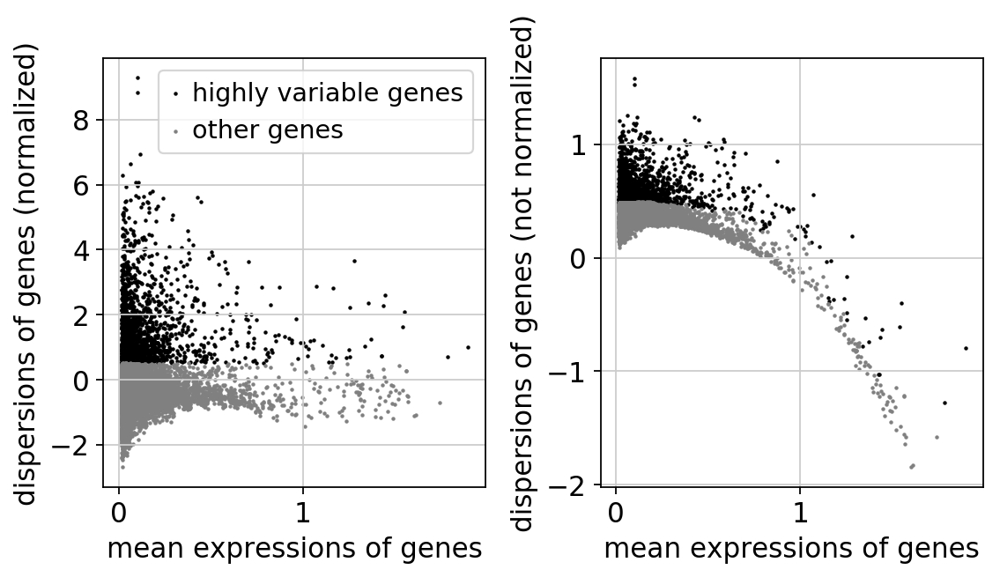

In [195]:
sc.set_figure_params()
sc.pp.highly_variable_genes(adata)
sc.pl.highly_variable_genes(adata)

In [196]:
adata.var['highly_variable']['HLA-G']

False

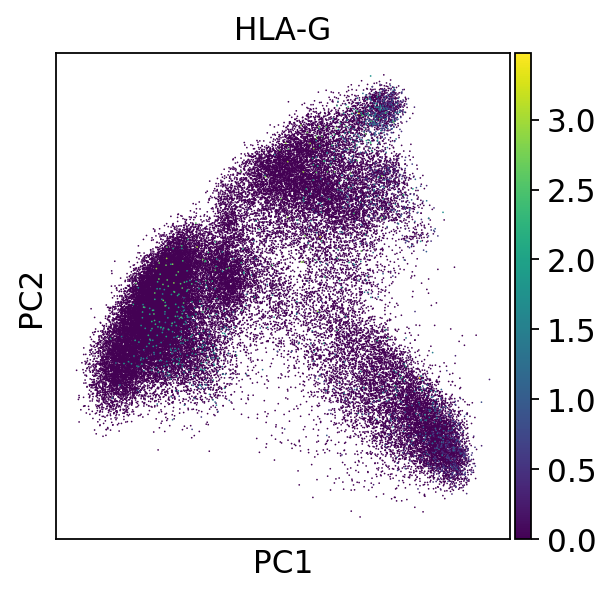

In [197]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca(adata, color='HLA-G')

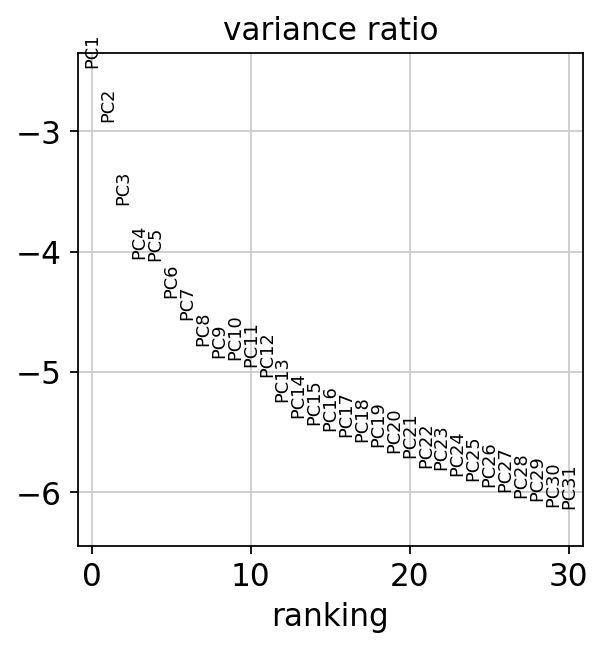

In [198]:
sc.pl.pca_variance_ratio(adata, log=True)

In [199]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.tsne(adata)
sc.tl.louvain(adata)

In [200]:
adata.write_h5ad(ANNDATA_FNAME)

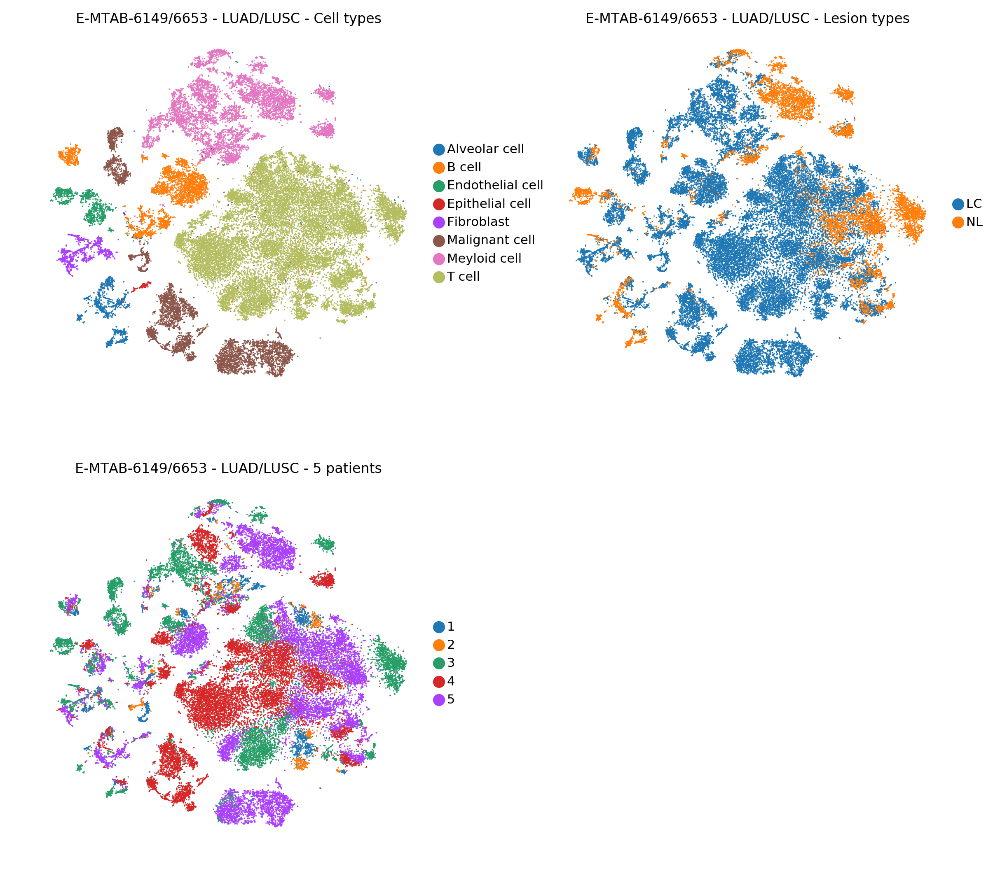

In [201]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=8)
sc.pl.tsne(adata, color=['cell_type', 'lesion_type', 'patient_id'], 
           title=['E-MTAB-6149/6653 - LUAD/LUSC - Cell types', 
                  'E-MTAB-6149/6653 - LUAD/LUSC - Lesion types', 
                  'E-MTAB-6149/6653 - LUAD/LUSC - {} patients'.format(len(adata.obs.patient_id.unique()))], ncols=2)

# GSE81861 - Colorectal adenocarcinoma (COAD & READ)


_Publication:_

Reference component analysis of single-cell transcriptomes elucidates cellular heterogeneity in human colorectal tumors.

Huipeng Li, Elise T Courtois, Debarka Sengupta, Yuliana Tan, Kok Hao Chen, Jolene Jie Lin Goh, Say Li Kong, Clarinda Chua, Lim Kiat Hon, Wah Siew Tan, Mark Wong, Paul Jongjoon Choi, Lawrence J K Wee, Axel M Hillmer, Iain Beehuat Tan, Paul Robson, Shyam Prabhakar

Intratumoral heterogeneity is a major obstacle to cancer treatment and a significant confounding factor in bulk-tumor profiling. We performed an unbiased analysis of transcriptional heterogeneity in colorectal tumors and their microenvironments using single-cell RNA-seq from 11 primary colorectal tumors and matched normal mucosa. To robustly cluster single-cell transcriptomes, we developed reference component analysis (RCA), an algorithm that substantially improves clustering accuracy. Using RCA, we identified two distinct subtypes of cancer-associated fibroblasts (CAFs). Additionally, epithelial-mesenchymal transition (EMT)-related genes were found to be upregulated only in the CAF subpopulation of tumor samples. Notably, colorectal tumors previously assigned to a single subtype on the basis of bulk transcriptomics could be divided into subgroups with divergent survival probability by using single-cell signatures, thus underscoring the prognostic value of our approach. Overall, our results demonstrate that unbiased single-cell RNA-seq profiling of tumor and matched normal samples provides a unique opportunity to characterize aberrant cell states within a tumor.

Nature genetics 2017

https://dx.doi.org/10.1038/ng.3818

_Data set acquisition:_

https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE81861

_Remark:_

The core of this dataset consists of 375 tumor cells collected and selected for from 11 patients. Of these 272 cells are from epithelial origin and therefore considered cancerous. The remaining cells are part of the TME.
In addition, the dataset contains 215 cells collected from normal tissue in 7 patients. 160 of these cells are from epithelial origin.
We disregard the cells collected from cell lines as this is not the focus of this study.

In [202]:
GEO_ACCESSION = "GSE81861"
BASE_FOLDER = "/home/bramvds/Documents/datasets"
DATASET_FOLDER = os.path.join(BASE_FOLDER, GEO_ACCESSION)
MTX_FNAME = os.path.join(DATASET_FOLDER, '{}.tpm.csv'.format(GEO_ACCESSION))
METADATA_FNAME = os.path.join(DATASET_FOLDER, '{}.metadata.csv'.format(GEO_ACCESSION))
ANNDATA_FNAME = os.path.join(DATASET_FOLDER, '{}.h5ad'.format(GEO_ACCESSION))

__EXPRESSION MATRIX AND METADATA CLEANING__

In [203]:
def process_gse81861(fname):
    # Load CSV file
    mtx = pd.read_csv(os.path.join(DATASET_FOLDER, fname), sep=',', index_col=0)
    
    # Extract gene symbol
    def gene(s):
        parts = s.split('_')
        return "_".join(parts[1:-1])
    mtx.index = list(map(gene, mtx.index))
    
    # Remove duplicate gene symbols (keep last when sorted ascending order according to row sum)
    mtx = mtx.iloc[mtx.sum(axis=1).argsort()]
    mtx = mtx[~mtx.index.duplicated(keep='last')]
    
    # From FPKM to TPM
    # Information on conversion taken from:
    # https://haroldpimentel.wordpress.com/2014/05/08/what-the-fpkm-a-review-rna-seq-expression-units/
    mtx = (mtx / mtx.sum(axis=0)) * 1e6
    
    return mtx

In [204]:
process_gse81861 = partial(process_gse81861)
mtx = pd.concat([
        process_gse81861('GSE81861_CRC_NM_all_cells_FPKM.csv'),
        #process_gse81861('GSE81861_CRC_NM_epithelial_cells_FPKM.csv'),
        process_gse81861('GSE81861_CRC_tumor_all_cells_FPKM.csv'),
        #process_gse81861('GSE81861_CRC_tumor_epithelial_cells_FPKM.csv'),
        #process_gse81861('GSE81861_Cell_Line_FPKM.csv'),
            ], axis=1)

/home/bramvds/Documents/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  


In [205]:
non_malignant_ids = set(map(lambda s: s.split('__')[0], process_gse81861('GSE81861_CRC_NM_all_cells_FPKM.csv').columns.values))
malignant_ids = set(map(lambda s: s.split('__')[0], process_gse81861('GSE81861_CRC_tumor_all_cells_FPKM.csv').columns.values))
CELLTYPE2NAME = {
    'Bcell': 'B Cell',
    'Endothelial': 'Endothelial Cell',
    'Epithelial': 'Epithelial Cell',
    'Fibroblast': 'Fibroblast',
    'Macrophage': 'Macrophage',
    'MastCell': 'MAST Cell',
    'NA': '?',
    'Tcell': 'T Cell'
}

def annotate(cellid):
    identifier = cellid.split('__')[0]
    origin = 'tumor' if identifier in malignant_ids else 'normal'
    celltype = CELLTYPE2NAME[cellid.split('__')[1]]
    return identifier, origin, celltype

cell_id2origin = {}
cell_id2cell_type = {}
for cellid in mtx.columns:
    identifier = cellid.split('__')[0]
    origin = 'tumor' if identifier in malignant_ids else 'normal'
    celltype = CELLTYPE2NAME[cellid.split('__')[1]]
    cell_id2origin[identifier] = origin
    cell_id2cell_type[identifier] = celltype

In [206]:
annotations = pd.concat([pd.Series(cell_id2origin, name='origin'), pd.Series(cell_id2cell_type, name='cell_type')], axis=1)

In [207]:
def annotate(cellid):
    return cellid.split('__')[0]

In [208]:
mtx.columns = mtx.columns.map(annotate)

In [210]:
mtx.to_csv(MTX_FNAME, sep=',', index=True)

In [211]:
annotations = annotations.reset_index().rename(columns={'index': 'sample_id'})

In [212]:
annotations.to_csv(METADATA_FNAME, sep=',')

In [149]:
annotations.head()

,sample_id,origin,cell_type
0,RHC3934,normal,B Cell
1,RHC3944,normal,B Cell
2,RHC3962,normal,T Cell
3,RHC4003,normal,B Cell
4,RHC4005,normal,B Cell


__ANNDATA__

In [213]:
adata = sc.AnnData(X=mtx.T.sort_index())
adata.obs = annotations.set_index('sample_id').sort_index()
adata.var_names_make_unique()
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
adata.raw = adata #Store non-log transformed data as raw. This data can be used via the use_raw parameters available for many functions.
sc.pp.log1p(adata)
adata

AnnData object with n_obs × n_vars = 590 × 29654 
    obs: 'origin', 'cell_type', 'n_genes'
    var: 'n_cells'

In [214]:
adata.write_h5ad(ANNDATA_FNAME)

... storing 'origin' as categorical
... storing 'cell_type' as categorical


__ADD DIMENSIONAL REDUCTIONS__

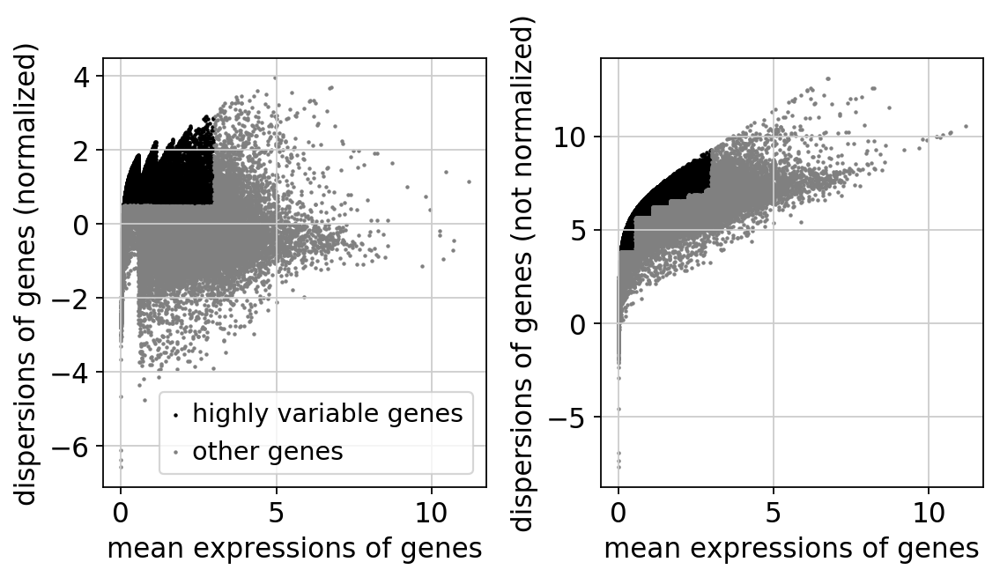

In [215]:
sc.set_figure_params()
sc.pp.highly_variable_genes(adata)
sc.pl.highly_variable_genes(adata)

In [216]:
adata.var['highly_variable']['HLA-G']

False

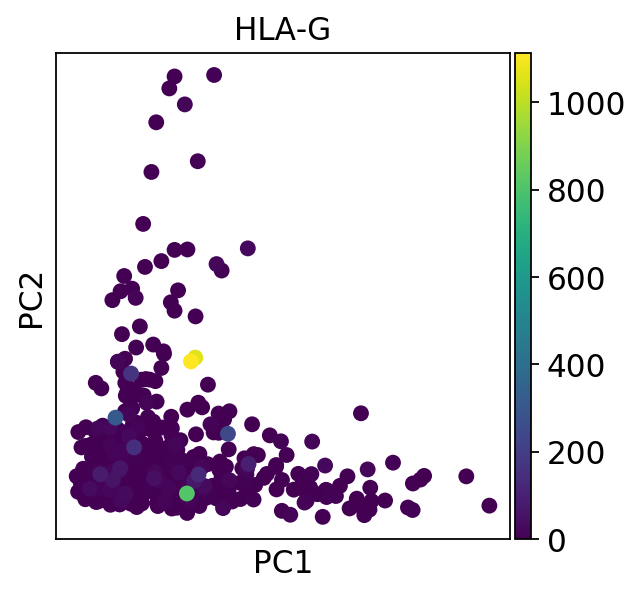

In [217]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca(adata, color='HLA-G')

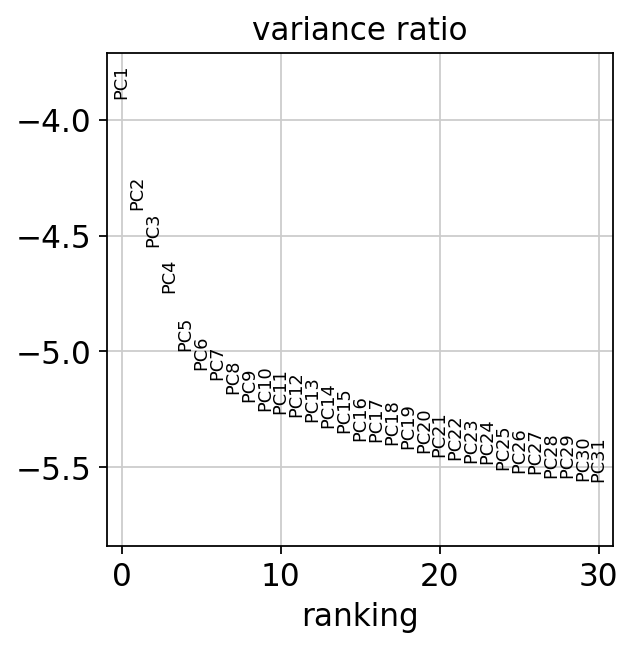

In [218]:
sc.pl.pca_variance_ratio(adata, log=True)

In [219]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.tsne(adata)
sc.tl.louvain(adata)

In [220]:
adata.write_h5ad(ANNDATA_FNAME)

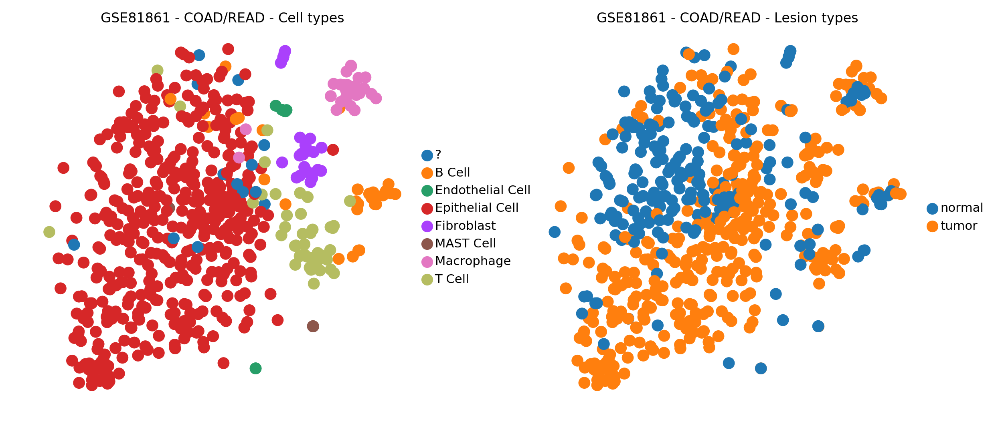

In [221]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=8)
sc.pl.tsne(adata, color=['cell_type', 'origin'], 
           title=['GSE81861 - COAD/READ - Cell types', 
                  'GSE81861 - COAD/READ - Lesion types'], ncols=2)